In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
p07a=sc.read_h5ad('12H007_PROCESSED.h5')
p09a=sc.read_h5ad('07H009_PROCESSED.h5')
p58a=sc.read_h5ad('09H058_PROCESSED.h5')
p56a=sc.read_h5ad('10H056_PROCESSED.h5')
p40a=sc.read_h5ad('11H240_PROCESSED.h5')
p10a=sc.read_h5ad('12H010_PROCESSED.h5')
p56Ua=sc.read_h5ad('10H056_Unsorted_PROCESSED.h5')
p58Ua=sc.read_h5ad('09H058_Unsorted_PROCESSED.h5')
p40Ua=sc.read_h5ad('11H240_Unsorted_PROCESSED.h5')
p07Ua=sc.read_h5ad('12H007_Unsorted_PROCESSED.h5')

In [3]:
adata_full=p07a.concatenate(p09a,p58a,p56a,p40a,p10a,p56Ua,p58Ua,p40Ua,p07Ua)

In [4]:
p07=p07a.to_df()
p09=p09a.to_df()
p58=p58a.to_df()
p56=p56a.to_df()
p40=p40a.to_df()
p10=p10a.to_df()
p58U=p58Ua.to_df()
p56U=p56Ua.to_df()
p40U=p40Ua.to_df()
p07U=p07Ua.to_df()

In [5]:
np07=p07.to_numpy()
np09=p09.to_numpy()
np58=p58.to_numpy()
np56=p56.to_numpy()
np40=p40.to_numpy()
np10=p10.to_numpy()
np58U=p58U.to_numpy()
np56U=p56U.to_numpy()
np40U=p40U.to_numpy()
np07U=p07U.to_numpy()

In [6]:
genes07=p07.columns.to_list()
genes09=p09.columns.to_list()
genes58=p58.columns.to_list()
genes56=p56.columns.to_list()
genes40=p40.columns.to_list()
genes10=p10.columns.to_list()
genes58U=p58U.columns.to_list()
genes56U=p56U.columns.to_list()
genes40U=p40U.columns.to_list()
genes07U=p07U.columns.to_list()

#get the list of genes that are shared between all of the samples
shared_genes=np.intersect1d(genes07,genes09)
shared_genes=np.intersect1d(shared_genes,genes58)
shared_genes=np.intersect1d(shared_genes,genes56)
shared_genes=np.intersect1d(shared_genes,genes40)
shared_genes=np.intersect1d(shared_genes,genes10)
shared_genes=np.intersect1d(shared_genes,genes58U)
shared_genes=np.intersect1d(shared_genes,genes56U)
shared_genes=np.intersect1d(shared_genes,genes40U)
shared_genes=np.intersect1d(shared_genes,genes07U)

In [7]:
np07.shape

(2152, 17446)

In [8]:
red07=[]
red09=[]
red58=[]
red56=[]
red40=[]
red10=[]
red58U=[]
red56U=[]
red40U=[]
red07U=[]

#reduce each sample down to the shared genes (now they will be in alphabetical order)
for i in range(len(shared_genes)):
    red07.append(np07[:,genes07.index(shared_genes[i])])
    red09.append(np09[:,genes09.index(shared_genes[i])])
    red58.append(np58[:,genes58.index(shared_genes[i])])
    red56.append(np56[:,genes56.index(shared_genes[i])])
    red40.append(np40[:,genes40.index(shared_genes[i])])
    red10.append(np10[:,genes10.index(shared_genes[i])])
    red58U.append(np58U[:,genes58U.index(shared_genes[i])])
    red56U.append(np56U[:,genes56U.index(shared_genes[i])])
    red40U.append(np40U[:,genes40U.index(shared_genes[i])])
    red07U.append(np07U[:,genes07U.index(shared_genes[i])])

In [9]:
#create an indicator array to store the labels 
indicator=[]
numericalindicator=[]
dnmmuts=[]
dnmwt=[]
npm1muts=[]
npm1wt=[]
lympho=[]
ery=[]
doublets=[]

npm1muts+=list(p07a.obs["NPM1_mut"])
npm1wt+=list(p07a.obs["NPM1_wt"])
lympho+=list(p07a.obs["lympho"])
ery+=list(p07a.obs["ery"])
doublets+=list(p07a.obs["doublets"])
for i in range(np07.shape[0]):
    indicator.append("12H007")
    numericalindicator.append(0)
    dnmmuts.append("N/A")
    dnmwt.append("N/A") 

npm1muts+=list(p09a.obs["NPM1_mut"])
npm1wt+=list(p09a.obs["NPM1_wt"])
dnmmuts+=list(p09a.obs["DNMT3A_mut"])
dnmwt+=list(p09a.obs["DNMT3A_wt"])
lympho+=list(p09a.obs["lympho"])
doublets+=list(p09a.obs["doublets"])
ery+=list(p09a.obs["ery"])
for i in range(np09.shape[0]):
    indicator.append("07H009_unsorted")
    numericalindicator.append(1)

dnmmuts+=list(p58a.obs["DNMT3A_mut"])
dnmwt+=list(p58a.obs["DNMT3A_wt"])
lympho+=list(p58a.obs["lympho"])
ery+=list(p58a.obs["ery"])
doublets+=list(p58a.obs["doublets"])
for i in range(np58.shape[0]):
    indicator.append("09H058")
    npm1muts.append("N/A")
    npm1wt.append("N/A")
    numericalindicator.append(2)

lympho+=list(p56a.obs["lympho"])
ery+=list(p56a.obs["ery"])
doublets+=list(p56a.obs["doublets"])
for i in range(np56.shape[0]):
    indicator.append("10H056")
    dnmmuts.append("N/A")
    dnmwt.append("N/A") 
    npm1muts.append("N/A")
    npm1wt.append("N/A")
    numericalindicator.append(3)

dnmmuts+=list(p40a.obs["DNMT3A_mut"])
dnmwt+=list(p40a.obs["DNMT3A_wt"])
lympho+=list(p40a.obs["lympho"])
ery+=list(p40a.obs["ery"])
doublets+=list(p40a.obs["doublets"])
for i in range(np40.shape[0]):
    indicator.append("11H240")
    npm1muts.append("N/A")
    npm1wt.append("N/A")
    numericalindicator.append(4)

npm1muts+=list(p10a.obs["NPM1_mut"])
npm1wt+=list(p10a.obs["NPM1_wt"])
dnmmuts+=list(p10a.obs["DNMT3A_mut"])
dnmwt+=list(p10a.obs["DNMT3A_wt"])
lympho+=list(p10a.obs["lympho"])
ery+=list(p10a.obs["ery"])
doublets+=list(p10a.obs["doublets"])
for i in range(np10.shape[0]):
    indicator.append("12H010")
    numericalindicator.append(5)

dnmmuts+=list(p58Ua.obs["DNMT3A_mut"])
dnmwt+=list(p58Ua.obs["DNMT3A_wt"])
lympho+=list(p58Ua.obs["lympho"])
ery+=list(p58Ua.obs["ery"])
doublets+=list(p58Ua.obs["doublets"])
for i in range(np58U.shape[0]):
    indicator.append("09H058_unsorted")
    npm1muts.append("N/A")
    npm1wt.append("N/A")
    numericalindicator.append(2)

lympho+=list(p56Ua.obs["lympho"])
ery+=list(p56Ua.obs["ery"])
doublets+=list(p56Ua.obs["doublets"])
for i in range(np56U.shape[0]):
    indicator.append("10H056_unsorted")
    dnmmuts.append("N/A")
    dnmwt.append("N/A") 
    npm1muts.append("N/A")
    npm1wt.append("N/A")
    numericalindicator.append(3)

lympho+=list(p40Ua.obs["lympho"])
ery+=list(p40Ua.obs["ery"])
doublets+=list(p40Ua.obs["doublets"])
for i in range(np40U.shape[0]):
    indicator.append("11H240_unsorted")
    dnmmuts.append("N/A") #note, no DNMT3a mutations were detected in this patient's unsorted cells (is this correct?)
    dnmwt.append("N/A") 
    npm1muts.append("N/A")
    npm1wt.append("N/A")
    numericalindicator.append(4)

npm1muts+=list(p07Ua.obs["NPM1_mut"])
npm1wt+=list(p07Ua.obs["NPM1_wt"])
lympho+=list(p07Ua.obs["lympho"])
ery+=list(p07Ua.obs["ery"])
doublets+=list(p07Ua.obs["doublets"])
for i in range(np07U.shape[0]):
    indicator.append("12H007_unsorted")
    dnmmuts.append("N/A") 
    dnmwt.append("N/A") 
    numericalindicator.append(0)

In [10]:
#concatenate all the samples
cohort=np.concatenate((red07,red09,red58,red56,red40,red10,red58U,red56U,red40U,red07U),axis=1)

In [11]:
#now the cohort will have dimensions cells x shared genes
cohort=np.transpose(cohort)

In [12]:
cohort.shape

(57436, 14468)

In [13]:
#normalize + log transform using scanpy

#cohort_df = pd.DataFrame(data=cohort,columns=shared_genes)
#adata_full = sc.AnnData(X=cohort_df)

#NORMALIZATION AND LOG TRANSFORM
sc.pp.calculate_qc_metrics(adata_full, inplace=True)

# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
adata_full.obs['original_total_counts'] = adata_full.obs['total_counts']

# log10 original library size
adata_full.obs['log10_original_total_counts'] = np.log10(adata_full.obs['original_total_counts'])

# Normalize by median library size
med = np.median(adata_full.obs['original_total_counts'])
sc.pp.normalize_per_cell(adata_full, counts_per_cell_after = med)

#log transform + 1 and updates adata.X
sc.pp.log1p(adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [14]:
len(ery)

57436

In [15]:
adata_full.obs["indicator"]=indicator
adata_full.obs["lympho"]=lympho
adata_full.obs["ery"]=ery
adata_full.obs["doublets"]=doublets

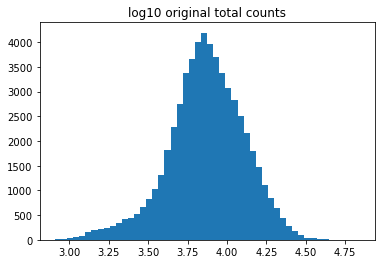

In [16]:
import matplotlib.pyplot as plt
plt.hist(adata_full.obs['log10_original_total_counts'], bins = 50)
plt.title('log10 original total counts')
plt.show()

Run this if we want to look at CD34+ cells only

In [ ]:
x = adata_full.to_df()
cd34=x["CD34"]

import matplotlib.pyplot as plt
plt.hist(cd34, bins = 50)
plt.title('CD34 expression')
plt.show()

In [153]:
#FILTER AND REPEAT 
del_ind = []
cell_ids = list(cohort_df.index)
for i in range(len(cell_ids)):
    if cd34[i]<0.1:
        del_ind.append(cell_ids[i])

raw_filtered = cohort_df.drop(del_ind)

In [154]:
#normalize + log transform using scanpy

adata_full = sc.AnnData(X=raw_filtered)

#NORMALIZATION AND LOG TRANSFORM
sc.pp.calculate_qc_metrics(adata_full, inplace=True)

# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
adata_full.obs['original_total_counts'] = adata_full.obs['total_counts']

# log10 original library size
adata_full.obs['log10_original_total_counts'] = np.log10(adata_full.obs['original_total_counts'])

# Normalize by median library size
med = np.median(adata_full.obs['original_total_counts'])
sc.pp.normalize_per_cell(adata_full, counts_per_cell_after = med)

#log transform + 1 and updates adata.X
sc.pp.log1p(adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


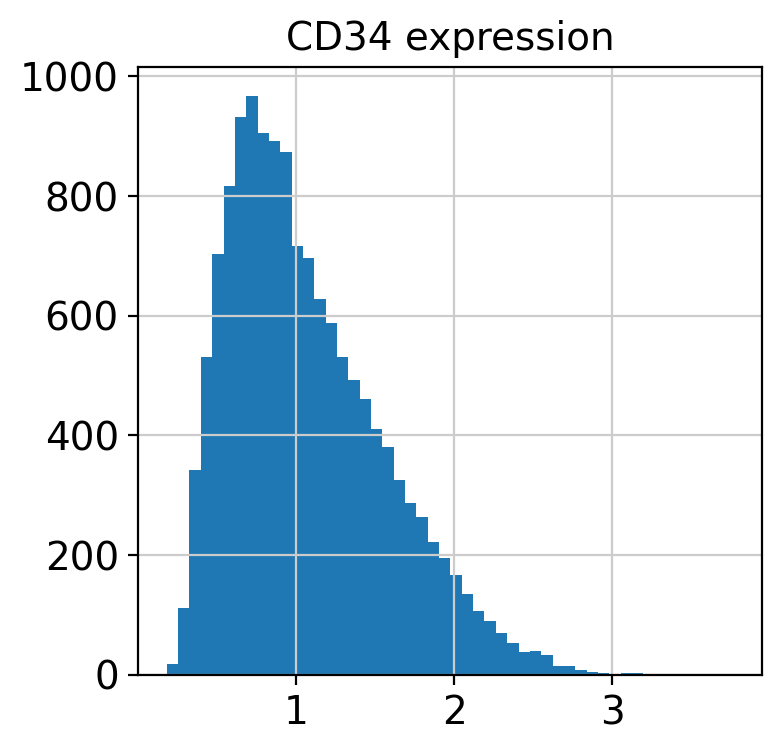

In [155]:
x = adata_full.to_df()
cd34=x["CD34"]

import matplotlib.pyplot as plt
plt.hist(cd34, bins = 50)
plt.title('CD34 expression')
plt.show()

In [168]:
indicator_new=[]
npm1_new=[]
dnm_new=[]
for i in range(len(indicator)):
    if ((i in del_ind)==False):
        indicator_new.append(indicator[i])
        npm1_new.append(npm1muts[i])
        dnm_new.append(dnmmuts[i])

In [170]:
adata_full.obs["indicator"]=indicator_new
adata_full.obs["npm1"]=npm1_new
adata_full.obs["dnmt3a"]=dnm_new

Otherwise continue running here

In [17]:
# PCA
#change from 20 to 50
n_comps = 80 # For tsne

# Phenograph
# I keep a low k at this stage because I want to remove small communities with precision
#lower from 15 to 8 for even greater resolution
k = 5

#TSNE
perplexity = 150

In [18]:
# pca of n_components
sc.pp.pca(adata_full, n_comps= 100)

In [19]:
communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_full.obsm['X_pca']), k = k)

adata_full.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
adata_full.uns['PhenoGraph_Q'] = Q

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 76.9687008857727 seconds
Jaccard graph constructed in 2.8806869983673096 seconds
Wrote graph to binary file in 0.0707857608795166 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.960358
Louvain completed 21 runs in 9.07612681388855 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 91.5410737991333 seconds


In [20]:
sc.tl.tsne(adata_full, n_pcs=n_comps, perplexity=perplexity)

In [21]:
sc.pp.neighbors(adata_full, n_neighbors=10, n_pcs=None, 
                        use_rep=None, knn=True, random_state=0, 
                        method='umap', metric='euclidean', metric_kwds={}, copy=False)

In [22]:
# Palette for phenograph clusters
pmap2=[ "#010067","#9E008E","#FFE502","#005F39","#00FF00","#FF937E",
          "#A42400","#001544","#91D0CB","#620E00","#0000FF","#007DB5","#6A826C","#00AE7E","#C28C9F",
          "#BE9970","#008F9C","#5FAD4E","#FF0000","#FF00F6","#FF029D","#683D3B","#FF74A3","#968AE8","#98FF52",
          "#A75740","#01FFFE","#FFEEE8","#FE8900","#BDC6FF","#01D0FF","#BB8800","#7544B1","#A5FFD2","#FFA6FE",
          "#774D00","#7A4782","#263400","#004754","#43002C","#B500FF","#FFB167","#FFDB66","#90FB92","#7E2DD2",
          "#BDD393","#E56FFE","#DEFF74","#00FF78","#009BFF","#006401","#0076FF","#85A900","#00B917","#788231",
          "#00FFC6","#FF6E41","#E85EBE"]

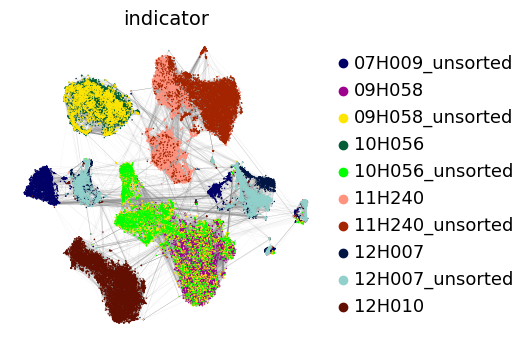

In [24]:
sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['indicator'],
    palette=pmap2, 
    edges = True, edges_width = 0.025,
    s=4,
    ncols=1,
    save="big_tsne.pdf"
)

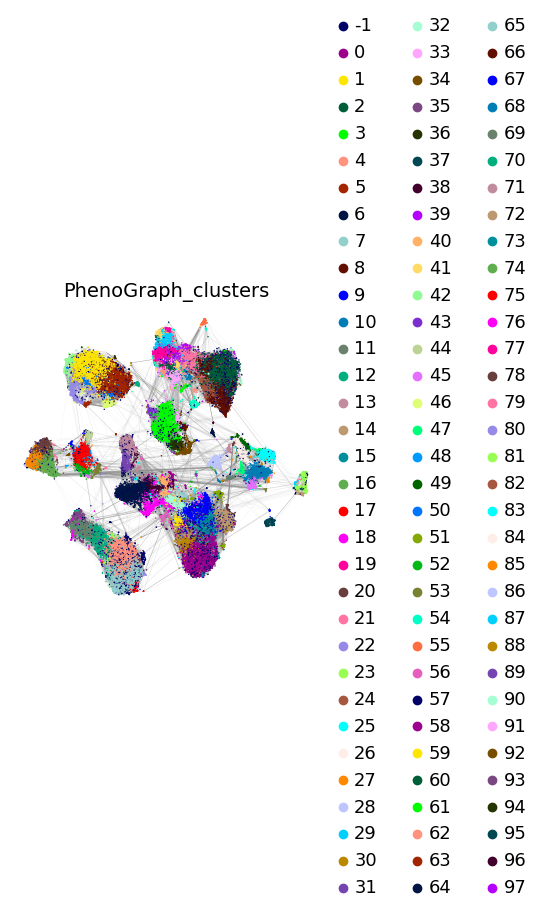

In [26]:
sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['PhenoGraph_clusters'], 
    edges = True, edges_width = 0.025,
    s=4,
    ncols=1,
    save="big_tsne_clusters.pdf"
)

In [21]:
binary=["lightgrey","red"]

... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'indicator' as categorical


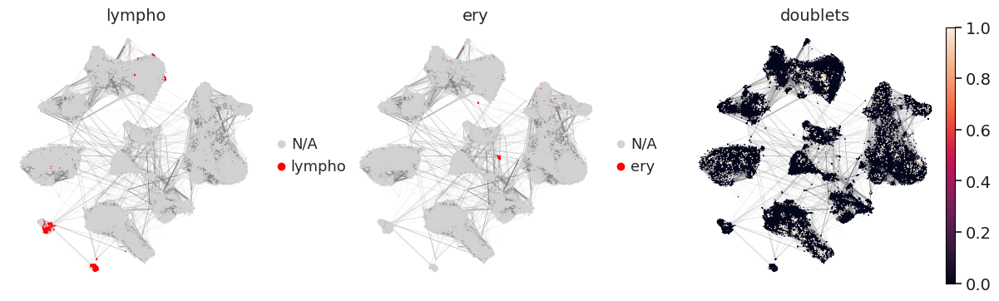

In [152]:
sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['lympho','ery','doublets'],
    palette=binary, 
    edges = True, edges_width = 0.025,
    s=4,
    ncols=3
)

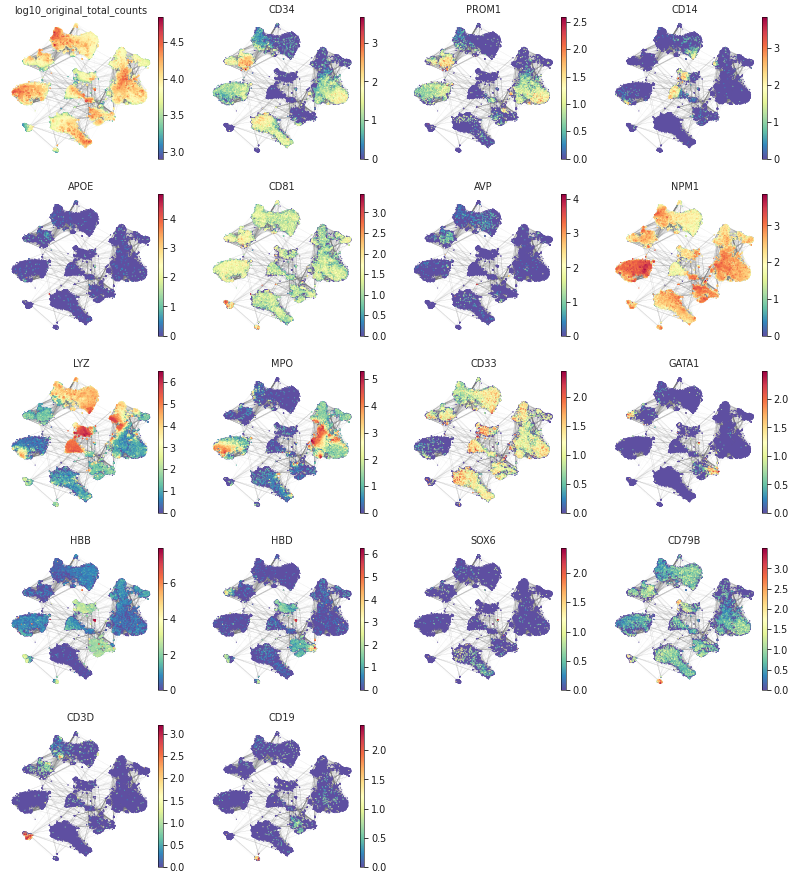

In [153]:
sc.set_figure_params(dpi=50, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['log10_original_total_counts','CD34','PROM1','CD14','APOE','CD81','AVP','NPM1','LYZ','MPO',"CD33",'GATA1','HBB','HBD','SOX6','CD79B','CD3D','CD19'],
    palette='tab20', color_map='Spectral_r', 
    edges = True, edges_width = 0.025,
    s=10
)

In [154]:
temp=[str(i) for i in range(20)]
sigs=pd.read_csv("gene_sigs.csv",names=temp,skiprows=[0])

In [155]:
adata_df=adata_full.to_df()

In [156]:
#create cell signature markers by averaging expression for each cell across all gene markers
sigs_np=np.asarray(sigs)
signatures=[]
for i in range(sigs_np.shape[0]):
    temp=[]
    for j in range(sigs_np.shape[1]):
        if pd.isnull(sigs_np[i][j])==False:
            if sigs_np[i][j] in adata_df.columns:
                temp.append(adata_df[sigs_np[i][j]])
    if len(temp)==0:
        signatures.append([0 for k in range(adata_df.shape[0])])
    else:
        signatures.append(np.mean(temp,axis=0))    

In [157]:
signatures=np.asarray(signatures)

In [158]:
signatures.shape

(14, 57436)

In [159]:
signatures=pd.DataFrame(np.transpose(signatures), columns=sigs.index)

In [160]:
signatures_types=sigs.index
signatures=np.asarray(signatures)
for i in range(signatures.shape[1]):
    adata_full.obs[signatures_types[i]]=signatures[:,i]

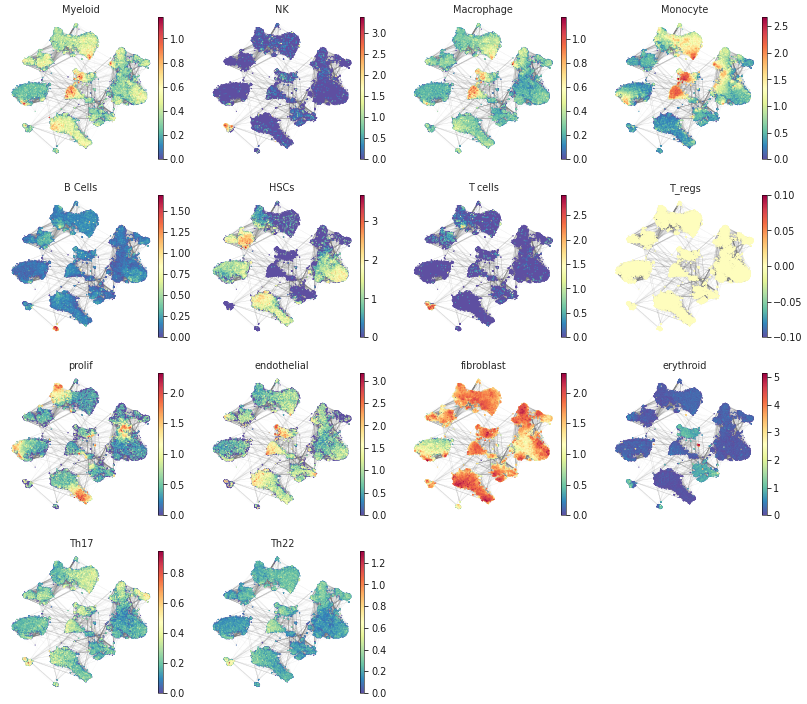

In [161]:
sc.set_figure_params(dpi=50, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=sigs.index,
    palette='tab20', color_map='Spectral_r', 
    edges = True, edges_width = 0.025,
    s=10
)

... storing 'NPM1_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'DNMT3A_wt' as categorical


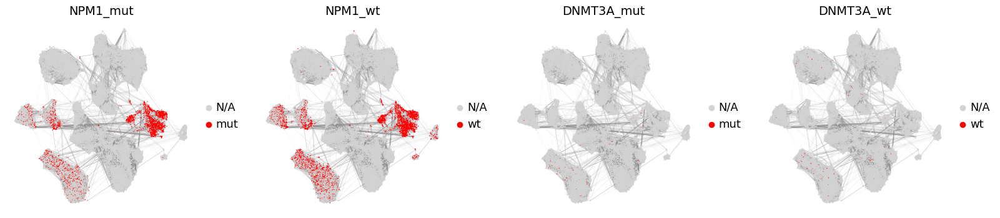

In [28]:
adata_full.obs["NPM1_mut"]=npm1muts
adata_full.obs["DNMT3A_mut"]=dnmmuts
adata_full.obs["NPM1_wt"]=npm1wt
adata_full.obs["DNMT3A_wt"]=dnmwt

binary=["lightgrey","red"]

sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['NPM1_mut','NPM1_wt','DNMT3A_mut','DNMT3A_wt'], 
    palette=binary,
    edges = True, edges_width = 0.025,
    s=4,
    save='npm1_muts.pdf'
)

TET2 correlation analysis on merged clusters

In [2]:
#read in tet2 patients
p08a=sc.read_h5ad('16H008_allsorted_cleaned.h5')
p89a=sc.read_h5ad('08H089_allsorted_cleaned.h5')
p7a=sc.read_h5ad('AML7_allsorted_cleaned.h5')
p72a=sc.read_h5ad('10H072_allsorted_cleaned.h5')

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/compat/__init__.py:179: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(
/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/compat/__init__.py:179: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  warn(


In [12]:
p89a = p7a

In [3]:
sc.pp.calculate_qc_metrics(p89a, inplace=True)

# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
p89a.obs['original_total_counts'] = p89a.obs['total_counts']

# log10 original library size
p89a.obs['log10_original_total_counts'] = np.log10(p89a.obs['original_total_counts'])
med = np.median(p89a.obs['original_total_counts'])
sc.pp.normalize_per_cell(p89a, counts_per_cell_after = med)

#log transform + 1 and updates adata.X
sc.pp.log1p(p89a)

/home/lf2684/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [4]:
obs = p89a.obs

In [5]:
sc.pp.neighbors(p89a,n_neighbors=30)

adj = p89a.obsp["connectivities"].todense()

adj = np.asarray(adj)
#fix so that self-self connectivity is 1 (to prevent cells from zeroeing out if no neighbors)
for i in range(adj.shape[0]):
    adj[i][i]==1

mut_ratio = []

for i in range(adj.shape[0]):
    muts = list(obs["NPM1_mut"][np.nonzero(adj[i])[0]]).count("mut")
    wt = list(obs["NPM1_wt"][np.nonzero(adj[i])[0]]).count("wt")
    mut_ratio.append(muts/(wt+1))

In [6]:
max(mut_ratio)

9.0

In [6]:
p89a.obs["mut_ratio"]=mut_ratio

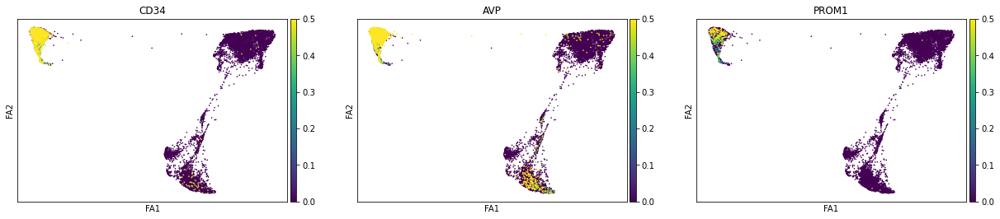

In [18]:
sc.pl.draw_graph(p89a,layout='fa',color=['CD34','AVP','PROM1'],vmax=.5,save='p08')

Text(0, 0.5, 'FA2')

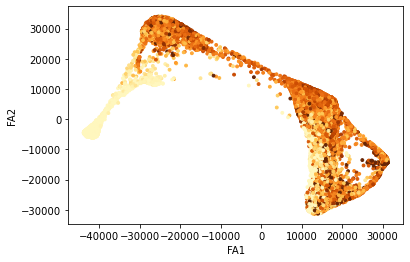

In [16]:
randomize=np.arange(p89a.shape[0])
np.random.shuffle(randomize)
x = p89a.obsm["X_draw_graph_fa"][:,0]#[randomize]
y = p89a.obsm["X_draw_graph_fa"][:,1]#[randomize]
plt.scatter(x,y,c=np.asarray(p89a.obs["mut_ratio"]),cmap="YlOrBr",s=8,vmin=-.2,vmax=1.5)
plt.xlabel("FA1")
plt.ylabel("FA2")

/home/lf2684/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Cell Types')

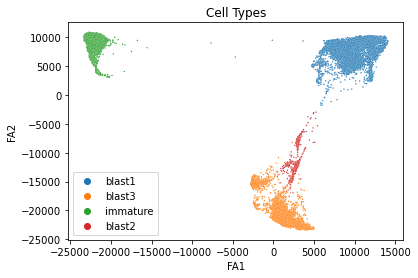

In [54]:
randomize=np.arange(p89a.shape[0])
np.random.shuffle(randomize)
x = p89a.obsm["X_draw_graph_fa"][:,0][randomize]
y = p89a.obsm["X_draw_graph_fa"][:,1][randomize]
sns.scatterplot(x,y,hue=np.asarray(p89a.obs["blast_cell_type_16H008"])[randomize],s=2)
plt.xlabel("FA1")
plt.ylabel("FA2")
plt.title("Cell Types")
#plt.savefig("figures/p89_celltypes.pdf")

Text(0.5, 1.0, 'PROM1')

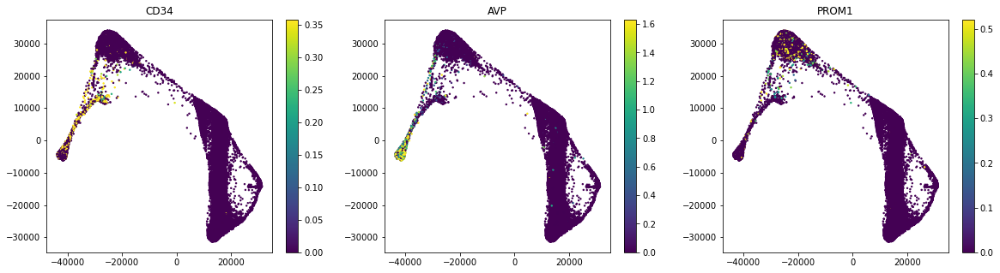

In [6]:
randomize=np.arange(p89a.shape[0])
np.random.shuffle(randomize)
fig,ax=plt.subplots(1,3,figsize=(20,5))
x = p89a.obsm["X_draw_graph_fa"][:,0][randomize]
y = p89a.obsm["X_draw_graph_fa"][:,1][randomize]
a0=ax[0].scatter(x,y,c=p89a.to_df()["CD34"][randomize],s=2,
                 rasterized=True,vmax=np.percentile(p89a.to_df()["CD34"],97))
cbar1=fig.colorbar(a0,ax=ax[0])
ax[0].set_title("CD34")

a0=ax[1].scatter(x,y,c=p89a.to_df()["AVP"][randomize],s=2,
                 rasterized=True,vmax=np.percentile(p89a.to_df()["AVP"],97))
cbar1=fig.colorbar(a0,ax=ax[1])
ax[1].set_title("AVP")

a0=ax[2].scatter(x,y,c=p89a.to_df()["PROM1"][randomize],s=2,
                 rasterized=True,vmax=np.percentile(p89a.to_df()["PROM1"],97))
cbar1=fig.colorbar(a0,ax=ax[2])
ax[2].set_title("PROM1")




#plt.title("Ratio of NPM1 mutation")
#plt.savefig("figures/AML3_CD34.pdf")

In [24]:
#10H072 has different labels, so changing immature_myelo to immature so it matches the other patients
#adjusted_labels=[]
#for i in p72a.obs["blast_cell_type_10H072"]:
#    if i=="immature_myelo":
#        adjusted_labels.append("immature")
#    else:
#        adjusted_labels.append(i)
#p72a.obs["blast_cell_type_10H072"]=adjusted_labels

In [3]:
p08=p08a.to_df()
p89=p89a.to_df()
p7=p7a.to_df()
p72=p72a.to_df()

In [4]:
np08=p08.to_numpy()
np89=p89.to_numpy()
np7=p7.to_numpy()
np72=p72.to_numpy()

In [5]:
genes08=p08.columns.to_list()
genes89=p89.columns.to_list()
genes7=p7.columns.to_list()
genes72=p72.columns.to_list()

In [6]:
#get the list of genes that are shared between all of the samples
shared_genestet=np.intersect1d(genes08,genes89)
shared_genestet=np.intersect1d(shared_genestet,genes7)
shared_genestet=np.intersect1d(shared_genestet,genes72)

In [7]:
red08=[]
red89=[]
red7=[]
red72=[]

#reduce each sample down to the shared genes (now they will be in alphabetical order)
for i in range(len(shared_genestet)):
    red08.append(np08[:,genes08.index(shared_genestet[i])])
    red89.append(np89[:,genes89.index(shared_genestet[i])])
    red7.append(np7[:,genes7.index(shared_genestet[i])])
    red72.append(np72[:,genes72.index(shared_genestet[i])])

In [8]:
tet2cohort=np.transpose(np.concatenate((red08,red89,red7,red72),axis=1))

In [9]:
tet2cohort.shape

(72945, 17704)

In [10]:
#get cell type labels from original adatas and create combined list
types08=p08a.obs['blast_cell_type_16H008']
types89=p89a.obs['blast_cell_type_08H089']
types7=p7a.obs['blast_cell_type_AML7']
types72=p72a.obs["blast_cell_type_10H072"]

tet2types=np.concatenate((types08,types89,types7,types72))

In [11]:
#create adata for all the combined tet2 patients

tet2cohort_df = pd.DataFrame(data=tet2cohort,columns=shared_genestet)
adata_tet = sc.AnnData(X=tet2cohort_df)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [12]:
#NORMALIZATION AND LOG TRANSFORM
sc.pp.calculate_qc_metrics(adata_tet, inplace=True)

# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
adata_tet.obs['original_total_counts'] = adata_tet.obs['total_counts']

# log10 original library size
adata_tet.obs['log10_original_total_counts'] = np.log10(adata_tet.obs['original_total_counts'])

# Normalize by median library size
med = np.median(adata_tet.obs['original_total_counts'])
sc.pp.normalize_per_cell(adata_tet, counts_per_cell_after = med)

#log transform + 1 and updates adata.X
sc.pp.log1p(adata_tet)

In [13]:
adata_tet.obs["celltypes"]=tet2types

In [14]:
#convert cell types to numerical so it works more easily with deg function
#np.unique(tet2types) use this to see which categories are present, and make number labels accordingly

numericalblast=[]
for i in tet2types:
    if i=="immature":
        numericalblast.append(0)
    if i=="blast0":
        numericalblast.append(1)
    if i=="blast1":
        numericalblast.append(2)
    if i=="blast2":
        numericalblast.append(3)
    if i=="blast3":
        numericalblast.append(4)
    if i=="immature_myelo":
        numericalblast.append(-2)
    if i=="ery":
        numericalblast.append(-1) #we can then set skip=-1 in deg function to skip erys

In [15]:
adata_tet.obs["numericalblast"]=numericalblast

In [43]:
#filter out genes occurring in fewer than 200 cells
#sc.pp.filter_genes(adata_full,min_cells=20)#140)

In [46]:
degs=ttest_degs(adata_tet,700,'celltypes')

... storing 'celltypes' as categorical


In [47]:
genelist=[]
for i in degs.columns:
    genelist.append(degs[i])
genelist=np.unique(np.ndarray.flatten(np.asarray(genelist)))
genelist_inds=[list(adata_tet.var_names).index(genelist[i]) for i in range(len(genelist))]

In [48]:
genelist_inds=np.asarray(genelist_inds)[np.argsort(genelist)]

In [49]:
len(genelist_inds)

3187

In [50]:
#IF USING MOST DIFFERENTIALLY EXPRESSED GENES
#degs = deg(adata_tet, 800, names=False, annot="numericalblast", skip=[-1,-2])
degs=genelist_inds
aml_genes=adata_full.var_names

#find DEGs within the tet2 groups of different celltypes 
top2k=[]
genes2k=[]
tet_genes = adata_tet.var_names
for i in degs:
    #only append degs that are also present in the cohort genes
    if tet_genes[i] in aml_genes:
        top2k.append(adata_tet.X[:,i])
        genes2k.append(tet_genes[i])
top2k = np.asarray(top2k)
#top2k contains all the cells but limited to the top DEGs

In [45]:
def ttest_degs(adata,n_genes_per_cluster,annot):

    #pca of n_components
    sc.pp.pca(adata, n_comps= 50)

    #communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata.obsm['X_pca']), k = 30)

    #adata.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
    #adata.uns['PhenoGraph_Q'] = Q

    sc.tl.rank_genes_groups(adata, annot , method='t-test', key_added = "t-test")

    ttest=pd.DataFrame()
    for i in np.unique(adata.obs[annot]):
        genelist=[]
        counts=0
        ttest_ii=sc.get.rank_genes_groups_df(adata,key='t-test',group=str(i))["names"]
        j=0
        while counts<=n_genes_per_cluster:
            if ("MT-" not in ttest_ii[j]) and ("RPS" not in ttest_ii[j]) and ("RPL" not in ttest_ii[j]):
                genelist.append(ttest_ii[j])
                counts+=1
            j+=1

        ttest["Cluster "+str(i)]=genelist
    return ttest

In [51]:
#now we create separate lists of each cell type in order to simulate dmap data
blast0=[]
blast1=[]
blast2=[]
blast3=[]
ery=[]
immature=[]
immature_myelo=[]


for i in range(tet2types.shape[0]):
    if tet2types[i]=='blast0':
        blast0.append(top2k[:,i])
    elif tet2types[i]=='blast1':
        blast1.append(top2k[:,i])
    elif tet2types[i]=='blast2':
        blast2.append(top2k[:,i])
    elif tet2types[i]=='blast3':
        blast3.append(top2k[:,i])
    elif tet2types[i]=='ery':
        ery.append(top2k[:,i])
    elif tet2types[i]=='immature':
        immature.append(top2k[:,i])
    elif tet2types[i]=='immature_myelo':
        immature_myelo.append(top2k[:,i])

In [52]:
#take the average of all the cell types to get a "representative cell"-this is done using DEGs only
blast0=np.mean(np.asarray(blast0),axis=0)
blast1=np.mean(np.asarray(blast1),axis=0)
blast2=np.mean(np.asarray(blast2),axis=0)
blast3=np.mean(np.asarray(blast3),axis=0)
#ery=np.mean(np.asarray(ery),axis=0)
immature=np.mean(np.asarray(immature),axis=0)
#immature_myelo=np.mean(np.asarray(immature_myelo),axis=0)

In [53]:
matrix = np.transpose(np.concatenate(([blast0],[blast1],[blast2],[blast3],[immature]),axis=0))
celltypes = ['blast0','blast1','blast2','blast3','immature']
genelist = shared_genestet
dmap = pd.DataFrame(data=matrix,index=genes2k,columns=celltypes) #this isn't dmap but im too lazy to change var names

In [126]:
dmap.to_csv("./TET2_cell_atlas")

In [54]:
dmap_filtered=np.asarray(dmap)

In [55]:
#now filter the dnm patients down to the same set of degs found for tet2
dnm_filtered=[]
aml_genes=adata_full.var_names
aml_genes_filtered=[]
for i in range(len(aml_genes)):
    if aml_genes[i] in genes2k:
        #dnm_filtered.append(adata_full.X[:,i].toarray())
        aml_genes_filtered.append(aml_genes[i])

#dnm_filtered=np.asarray(dnm_filtered)
#dnm_filtered.shape

In [56]:
aml_genes_filtered=np.asarray(aml_genes_filtered)[np.argsort(aml_genes_filtered)]

In [57]:
keepind=[list(adata_full.var_names).index(i) for i in aml_genes_filtered]

In [58]:
dnm_filtered=adata_full.X[:,keepind]

In [59]:
dnm_filtered.shape

(57436, 3128)

In [60]:
#GENES SHOULD BE IN THE SAME ORDER MAKE SURE TO CHECK

for i in range(len(aml_genes_filtered)):
    if aml_genes_filtered[i]!=genes2k[i]:
        print("oh no")

In [61]:
#build centroids using dnm data filtered to the same set of DEGs that were found for TET2
#maxx = np.amax(np.asarray(adata_full.obs['PhenoGraph_clusters']))+1
#minn = np.amin(np.asarray(adata_full.obs['PhenoGraph_clusters']))
#cluster_ids=adata_full.obs['PhenoGraph_clusters']
#centroids=[]

#we use min to max in case there are -1 clusters
#for i in range(minn,maxx):
#    temp=[]
#    for j in range(len(cluster_ids)):
#        if cluster_ids[j]==i:
#            temp.append(dnm_filtered[:,j])
#    #in case of empty clusters
#    if np.asarray(temp).shape[0]==0:
#        centroids.append([-1 for i in range(dnm_filtered.shape[0])])
#    else:
#        centroids.append(np.mean(temp,axis=0))

In [62]:
dnm_filtered=dnm_filtered.toarray()


In [63]:
#build centroids using dnm data filtered to the same set of DEGs that were found for TET2
#NOTE: here intentionally excluding the -1 clusters, those will just be assigned to N/A later
maxx = np.amax(np.asarray(adata_full.obs['PhenoGraph_clusters']))+1
cluster_ids=adata_full.obs['PhenoGraph_clusters']
centroids=[]


for i in range(maxx):
    temp=[]
    for j in range(len(cluster_ids)):
        if cluster_ids[j]==i:
            temp.append(dnm_filtered[j,:])
    #in case of empty clusters
    if np.asarray(temp).shape[0]==0:
        centroids.append([-1 for i in range(dnm_filtered.shape[1])])
    else:
        centroids.append(np.mean(temp,axis=0))

In [64]:
centroids=np.asarray(centroids)
centroids.shape

(98, 3128)

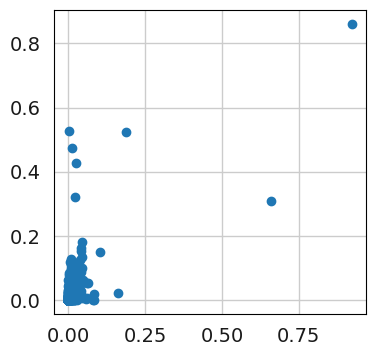

In [145]:
#check an arbitrary pair of celltype/centroid to see how strongly correlated they are
plt.scatter(blast0,centroids[4])

In [65]:
#perform pearson correlation for each cluster centroid to obtain a cell type annotation for each cluster
import scipy
from scipy import stats
celltypes = np.asarray(celltypes)
types = [] #store celltype with lowest pval OR highest correlation coefficients
typescoeff = [] #store the corr coeff for the selected celltype (for downstream filtering)
corr = [] #store all pvals OR correlation coefficients for heatmap
for i in range(centroids.shape[0]):
    pvals=[]
    corrcoeff=[]
    for j in range(dmap_filtered.shape[1]):
        pearson = scipy.stats.pearsonr(centroids[i],dmap_filtered[:,j])
        corrcoeff.append(pearson[0])
        pvals.append(pearson[1])
    corr.append(corrcoeff) #change this to append(pvals) if using pvals
    #print(i,celltypes[np.argmax(corrcoeff)],corrcoeff[np.argmax(corrcoeff)]) #change to argmin if using pvals
    types.append(celltypes[np.argmax(corrcoeff)]) #change to argmin if using pvals
    typescoeff.append(corrcoeff[np.argmax(corrcoeff)])

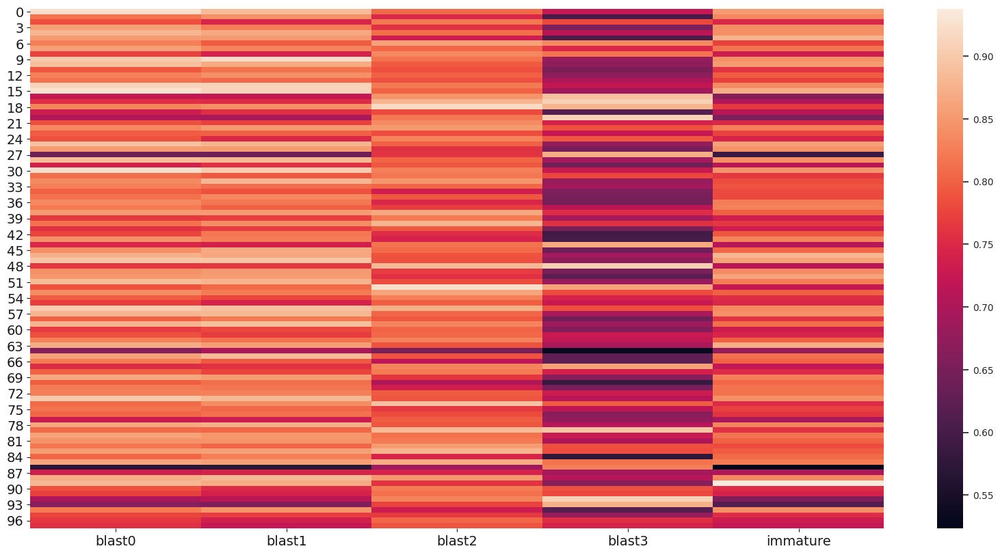

In [66]:
#heatmap to see how badly this failed
corr = pd.DataFrame(data=corr, columns=celltypes)

fig, ax = plt.subplots(figsize=(20,10))
sns.set(font_scale=0.9)
ax = sns.heatmap(corr)

In [67]:
#create a list of type labels for each cell based on which cluster it's in
#types_anno = []
#cluster_ids=adata_full.obs['PhenoGraph_clusters']

#if there are no -1 clusters
#if np.amin(np.asarray(cluster_ids))==0:
#    for i in range(len(cluster_ids)):
#        types_anno.append(types[cluster_ids[i]])

#    adata_full.obs['types']=types_anno
#else:
#    for i in range(len(cluster_ids)):
#        types_anno.append(types[cluster_ids[i]+1])

#    adata_full.obs['types']=types_anno

In [68]:
types_anno = []
lympho_anno = adata_full.obs['lympho']
ery_anno = adata_full.obs['ery']
cluster_ids=adata_full.obs['PhenoGraph_clusters']

for i in range(len(cluster_ids)):
    #if a cell has already been labeled as lympho or ery then just use that
    if lympho_anno[i]=="lympho":
        types_anno.append("lympho")
    elif ery_anno[i]=="ery":
        types_anno.append("ery")
    else:
        #we assign our -1 clusters to be N/A
        if cluster_ids[i]==-1:
            types_anno.append("N/A")
        else:
            types_anno.append(types[cluster_ids[i]])
        
adata_full.obs['types']=types_anno

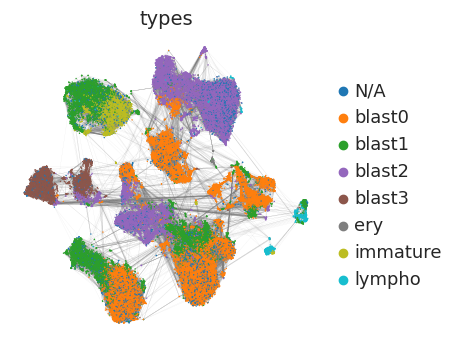

In [70]:
#see where the new celltype labels for dnm lie in the tsne
sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['types'],
    palette='tab10', 
    edges = True, edges_width = 0.025,
    s=4,
    save='bigtsne_types.pdf'
)

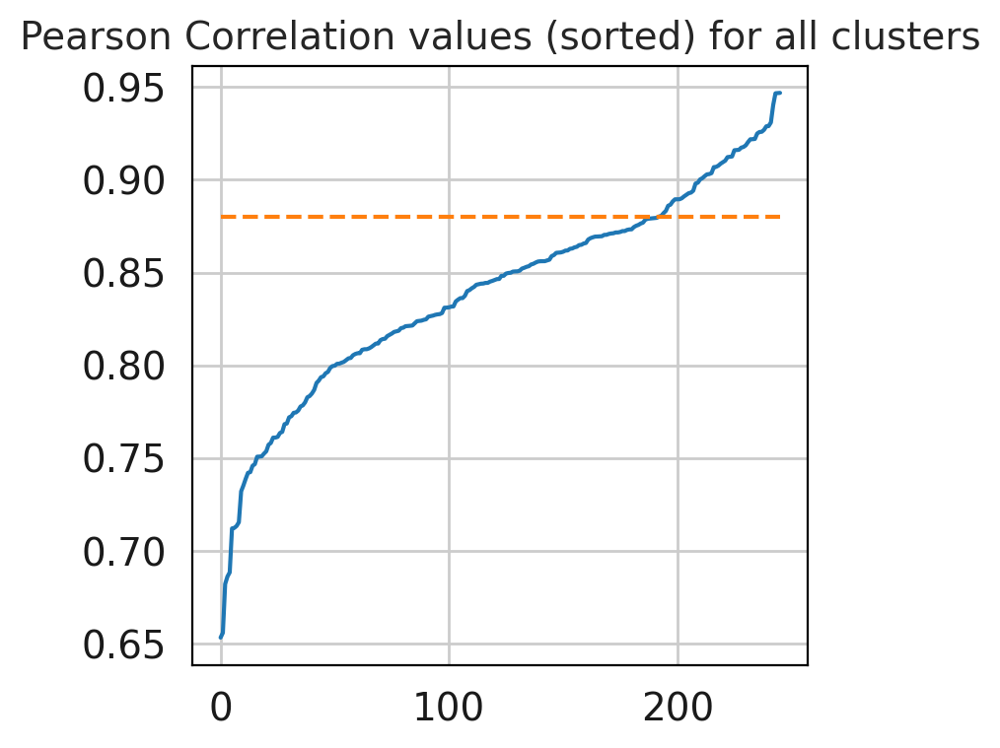

In [89]:
plt.plot(np.sort(np.asarray(corr).flatten()))
plt.title("Pearson Correlation values (sorted) for all clusters")
plt.plot([0.88 for i in range(41*6)],'--')

In [77]:
#if we choose the threshold to be 0.88:

filtered_types=[]
for i in range(len(typescoeff)):
    if typescoeff[i]<0.88:
        filtered_types.append("N/A")
    else:
        filtered_types.append(types[i])

In [78]:
#create a list of type labels for each cell based on which cluster it's in
types_anno = []
cluster_ids=adata_full.obs['PhenoGraph_clusters']
for i in range(len(cluster_ids)):
    types_anno.append(filtered_types[cluster_ids[i]])

In [79]:
adata_full.obs['filtered types']=types_anno

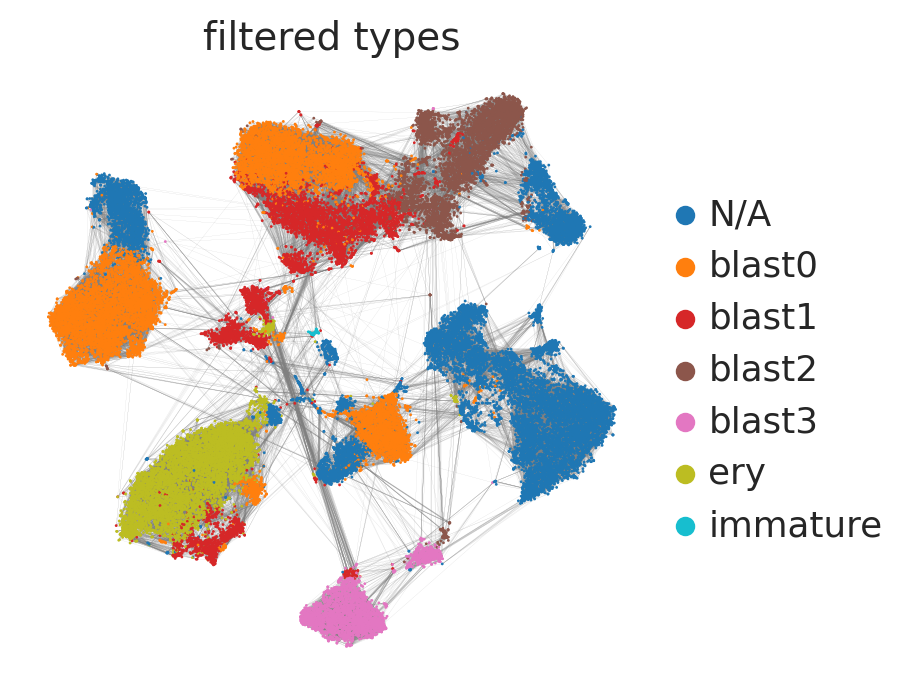

In [98]:
#see where the new celltype labels for dnm lie in the tsne
sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['filtered types'],
    palette='tab10', 
    edges = True, edges_width = 0.025,
    s=4
)

In [76]:
adata_full.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,original_total_counts,log10_original_total_counts,...,T_regs,prolif,endothelial,fibroblast,erythroid,Th17,Th22,types,NPM1_mut,DNMT3A_mut
0,1387,7.235619,3641.0,8.200288,42.323537,53.886295,62.647624,75.638561,3641.0,3.561221,...,0.0,0.0,0.000000,1.395232,0.234309,0.281070,0.172966,blast0,mut,NA
1,885,6.786717,1910.0,7.555382,44.816754,53.141361,63.821990,79.842932,1910.0,3.281033,...,0.0,0.0,0.000000,1.345006,1.051564,0.319496,0.319817,blast3,NA,NA
2,1788,7.489412,5022.0,8.521783,36.499403,47.311828,58.422939,72.839506,5022.0,3.700877,...,0.0,0.0,1.389575,1.363726,0.907697,0.000000,0.070686,blast3,NA,NA
3,2323,7.751045,8085.0,8.997890,41.422387,53.209647,62.498454,73.419913,8085.0,3.907680,...,0.0,0.0,0.000000,1.739630,0.716193,0.000000,0.153652,blast0,mut,NA
4,1782,7.486053,4888.0,8.494743,35.904255,46.644845,57.549100,71.910802,4888.0,3.689131,...,0.0,0.0,1.409949,1.695836,0.448639,0.116907,0.071943,blast3,NA,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52390,2085,7.643004,7393.0,8.908424,37.454349,52.901393,63.086704,75.233329,7393.0,3.868821,...,0.0,0.0,0.000000,1.493989,0.201366,0.000000,0.000000,blast2,NA,NA
52391,1747,7.466228,6062.0,8.709960,41.735401,56.680963,67.024084,78.835368,6062.0,3.782616,...,0.0,0.0,0.000000,1.647016,0.000000,0.414180,0.158597,blast2,NA,NA
52392,1835,7.515345,5908.0,8.684232,37.796209,52.572783,62.880840,75.524712,5908.0,3.771441,...,0.0,0.0,0.000000,1.484559,0.000000,0.261822,0.224541,blast2,NA,NA
52393,2375,7.773174,8812.0,9.083983,36.155243,51.588743,62.369496,74.228325,8812.0,3.945075,...,0.0,0.0,0.619825,1.765022,0.088546,0.236752,0.193372,blast2,NA,NA


Patient level annotations

In [143]:
def patient_types(patient, adata):
    #given a patient id, make a fdg showing cell types and genes of interest for that patient from the full cohort adata
    df = np.asarray(adata.to_df())
    patient_dat = []
    patient_types = []
    patient_counts = []
    patient_lympho = []
    patient_ery = []
    patient_monos=[]
    patient_myeloid = []
    patient_prolif = []
    patient_hscs=[]
    patient_fibros=[]
    patient_npm1=[]
    patient_npm1wt=[]
    patient_dnmt3a=[]
    patient_dnmt3awt=[]
    patient_doublets=[]
    cohort_ids = adata.obs["indicator"]
    cohort_types = adata.obs["types"]
    libsize = adata.obs["log10_original_total_counts"]
    lympho = adata.obs["lympho"]
    ery = adata.obs["ery"]
    monos = adata.obs["Monocyte"]
    myeloid = adata.obs["Myeloid"]
    prolif = adata.obs["prolif"]
    hscs = adata.obs["HSCs"]
    fibros = adata.obs["fibroblast"]
    npm1 = adata.obs["NPM1_mut"]
    npm1wt = adata.obs["NPM1_wt"]
    dnmt3a = adata.obs["DNMT3A_mut"]
    dnmt3awt = adata.obs["DNMT3A_wt"]
    doublets = adata.obs["doublets"]
    for i in range(df.shape[0]):
        if cohort_ids[i]==patient:
            patient_dat.append(df[i])
            patient_types.append(cohort_types[i])
            patient_counts.append(libsize[i])
            patient_lympho.append(lympho[i])
            patient_ery.append(ery[i])
            patient_monos.append(monos[i])
            patient_myeloid.append(myeloid[i])
            patient_prolif.append(prolif[i])
            patient_hscs.append(hscs[i])
            patient_fibros.append(fibros[i])
            patient_npm1.append(npm1[i])
            patient_npm1wt.append(npm1wt[i])
            patient_dnmt3a.append(dnmt3a[i])
            patient_dnmt3awt.append(dnmt3a[i])
            patient_doublets.append(doublets[i])

    patient_adata = sc.AnnData(X=pd.DataFrame(patient_dat,columns=adata.var_names))
    patient_adata.obs["types"]=patient_types
    patient_adata.obs["libsize"]=patient_counts
    patient_adata.obs["lympho"]=patient_lympho
    patient_adata.obs["ery"]=patient_ery
    patient_adata.obs["monocytes"]=patient_monos
    patient_adata.obs["myeloid"]=patient_myeloid
    patient_adata.obs["prolif"]=patient_prolif
    patient_adata.obs["hscs"]=patient_hscs
    patient_adata.obs["fibroblasts"]=patient_fibros
    patient_adata.obs["NPM1_mut"]=patient_npm1
    patient_adata.obs["DNMT3A_mut"]=patient_dnmt3a
    patient_adata.obs["NPM1_wt"]=patient_npm1wt
    patient_adata.obs["DNMT3A_wt"]=patient_dnmt3awt
    patient_adata.obs["doublets"]=[str(i) for i in patient_doublets]
    
    sc.pp.neighbors(patient_adata, n_neighbors=10, n_pcs=None, 
                        use_rep=None, knn=True, random_state=0, 
                        method='umap', metric='euclidean', metric_kwds={}, copy=False)
    sc.tl.draw_graph(patient_adata,layout="fa")
    sc.pl.draw_graph(patient_adata,layout="fa",color=["libsize","types","CD34","PROM1","HBB","LYZ","CD14","CD3D","CD79B","NPM1","monocytes","myeloid","prolif","hscs","fibroblasts"],ncols=5)
    
    
    binary=["lightgrey","red"]
    sc.pl.draw_graph(patient_adata,layout="fa",color=["NPM1_mut","NPM1_wt","DNMT3A_mut","DNMT3A_wt","doublets"], palette=binary,ncols=5)
    

    if patient=="12H007":
        raw=p07a.to_df()[adata.to_df().columns]
    if patient=="12H007_unsorted":
        raw=p07Ua.to_df()[adata.to_df().columns]
    elif patient=="07H009_unsorted":
        raw=p09a.to_df()[adata.to_df().columns]
    elif patient=="09H058":
        raw=p58a.to_df()[adata.to_df().columns]
    elif patient=="10H056":
        raw=p56a.to_df()[adata.to_df().columns]
    elif patient=="11H240":
        raw=p40a.to_df()[adata.to_df().columns]
    elif patient=="12H010":
        raw=p10a.to_df()[adata.to_df().columns]
    elif patient=="10H056_unsorted":
        raw=p56Ua.to_df()[adata.to_df().columns]
    elif patient=='09H058_unsorted':
        raw=p58Ua.to_df()[adata.to_df().columns]
    elif patient=="11H240_unsorted":
        raw=p40Ua.to_df()[adata.to_df().columns]
    
    #make a copy to save using raw counts
    data_copy=patient_adata.copy()
    data_copy.X=raw
    data_copy.obs["barcodes"]=raw.index
    data_copy.write_h5ad(patient+"_cohortlevel_annotations.h5")
    
    return patient_adata

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


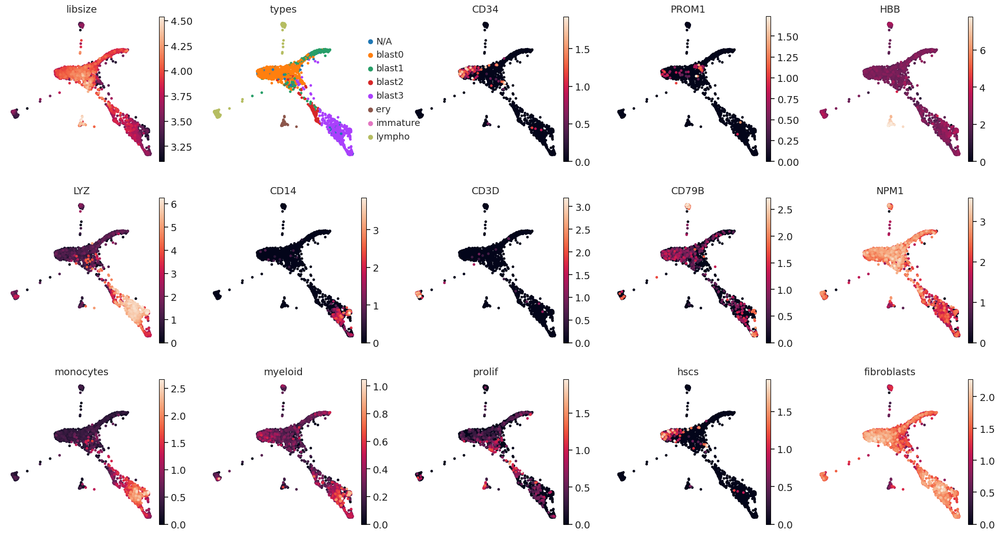

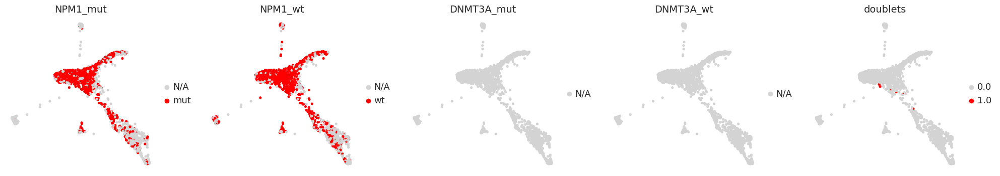

In [163]:
test07=patient_types("12H007",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


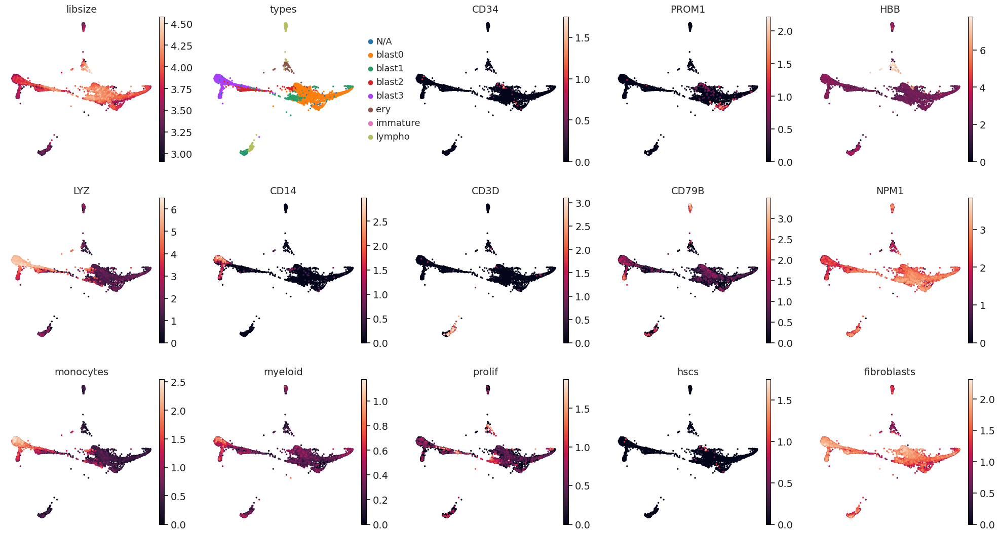

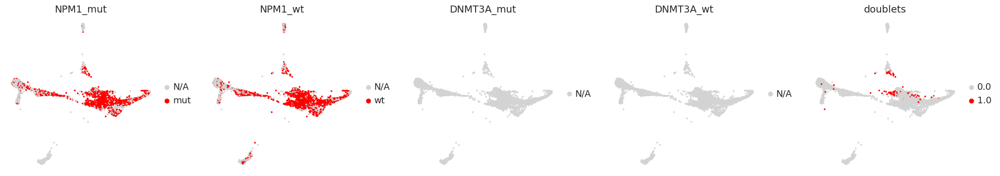

In [164]:
test07u=patient_types("12H007_unsorted",adata_full)

In [2]:
ad=sc.read_h5ad("12H007_unsorted_cohortlevel_annotations.h5")

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


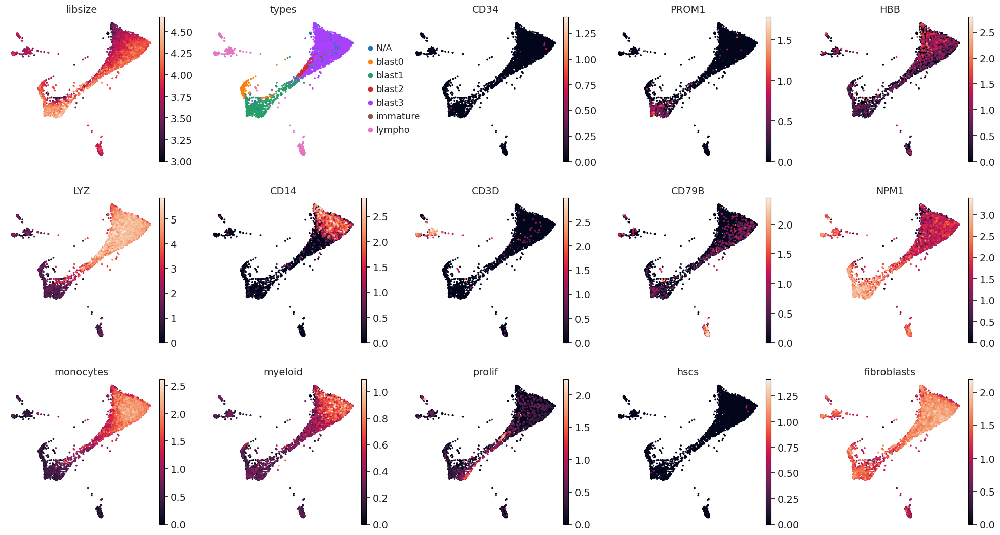

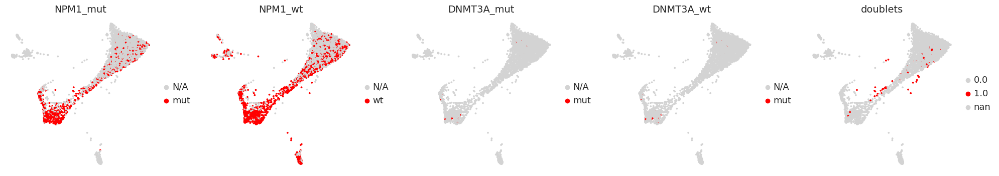

In [165]:
test09u=patient_types("07H009_unsorted",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


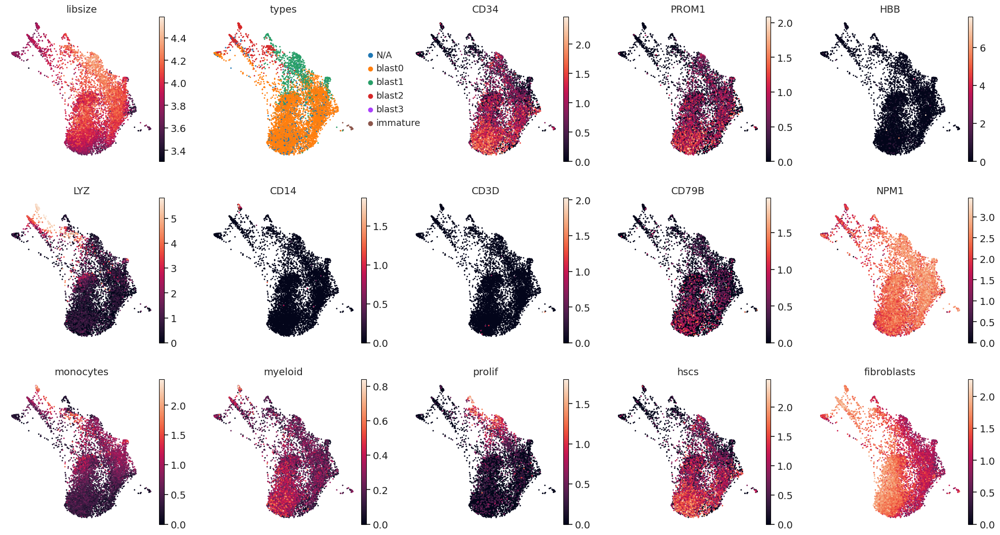

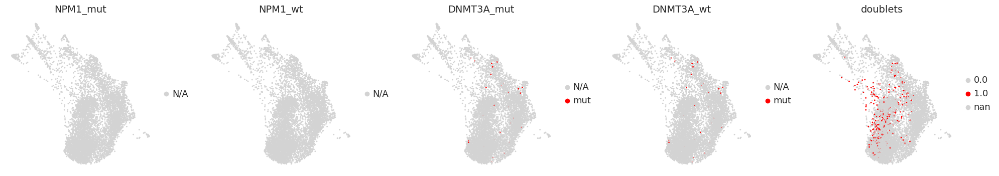

In [166]:
test58=patient_types("09H058",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


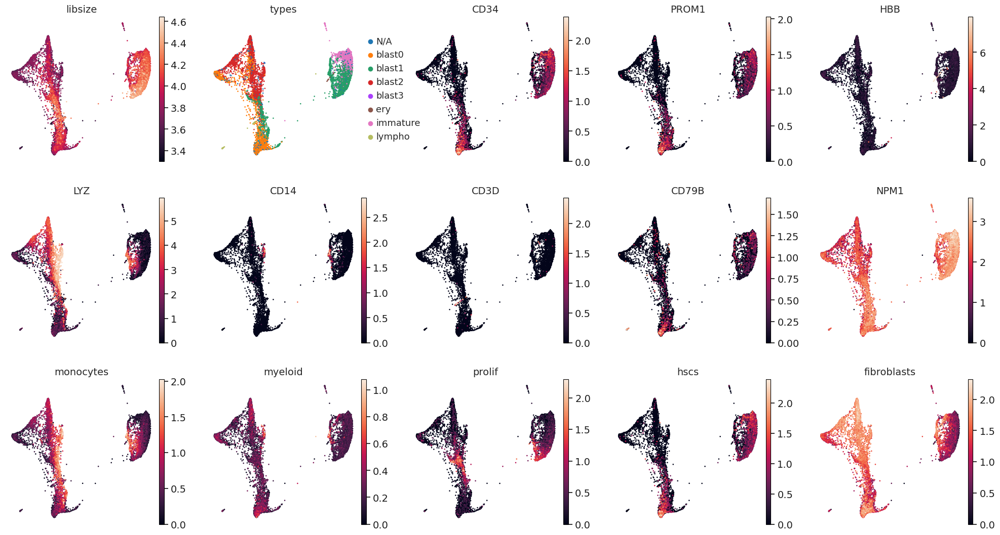

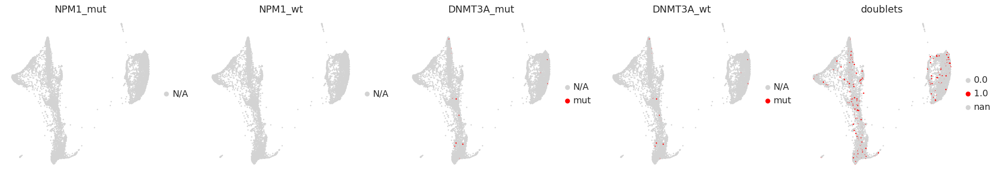

In [167]:
test58u=patient_types("09H058_unsorted",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


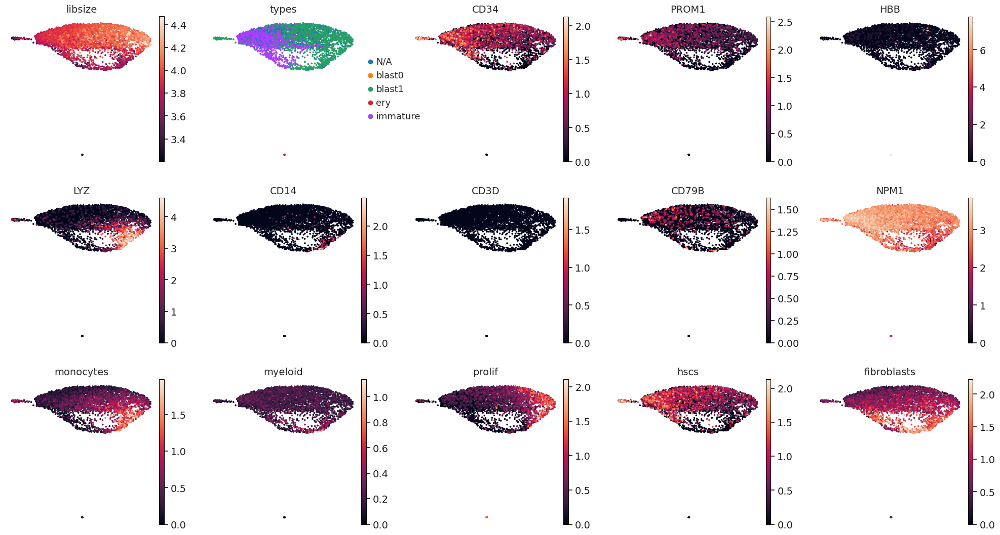

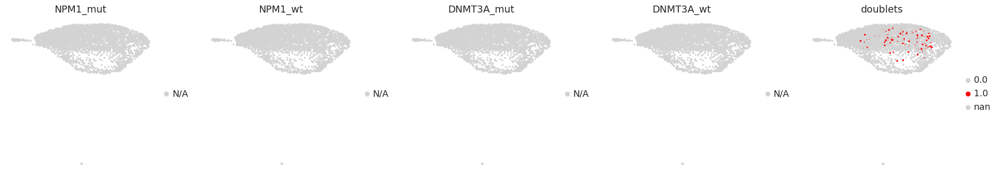

In [168]:
test56=patient_types("10H056",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


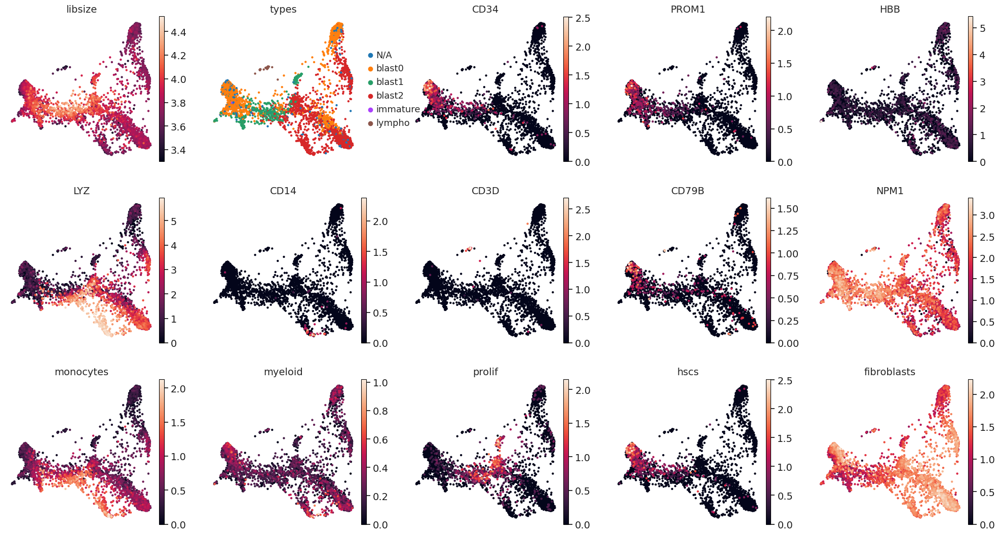

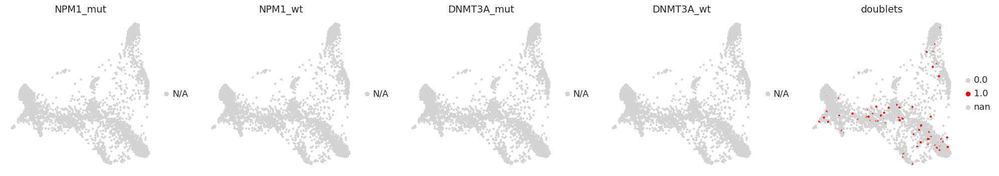

In [169]:
test56u=patient_types("10H056_unsorted",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


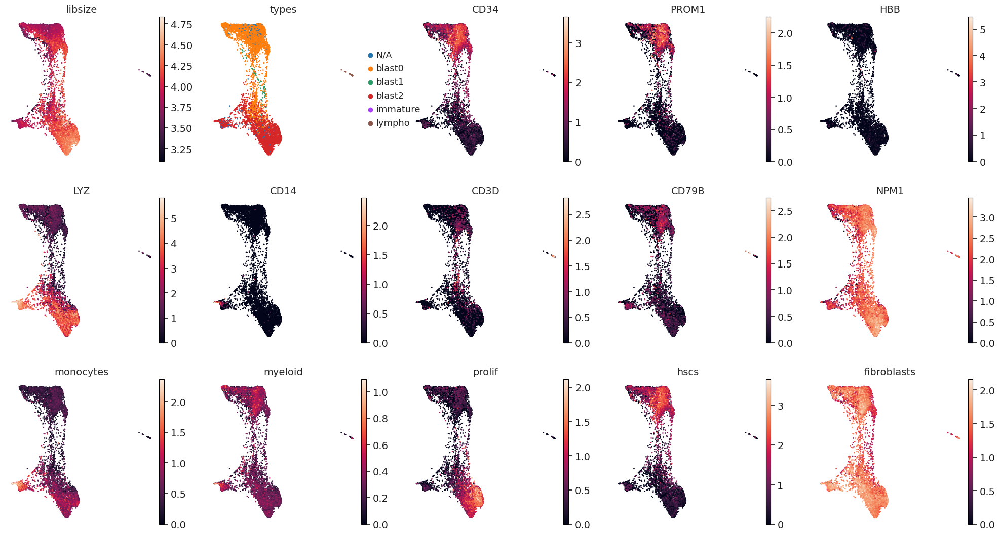

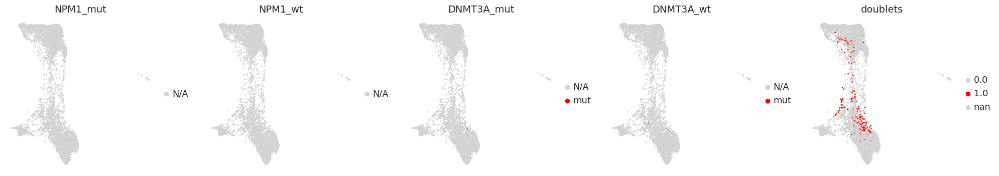

In [170]:
test40=patient_types("11H240",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


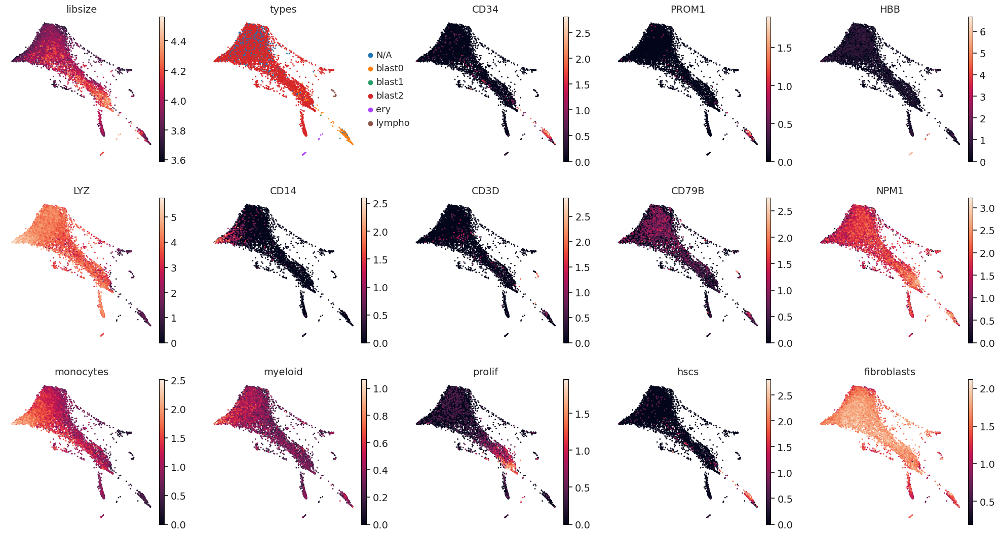

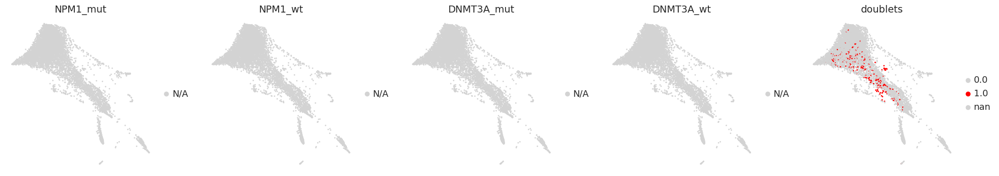

In [171]:
test40u=patient_types("11H240_unsorted",adata_full)

/home/lf2684/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
         Falling back to preprocessing with `sc.pp.pca` and default params.
... storing 'types' as categorical
... storing 'lympho' as categorical
... storing 'ery' as categorical
... storing 'NPM1_mut' as categorical
... storing 'DNMT3A_mut' as categorical
... storing 'NPM1_wt' as categorical
... storing 'DNMT3A_wt' as categorical
... storing 'doublets' as categorical


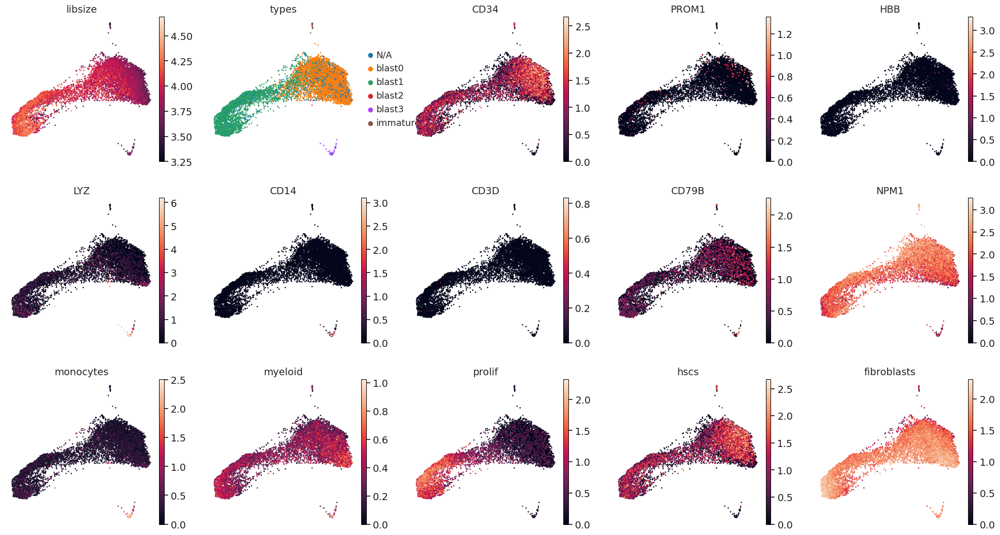

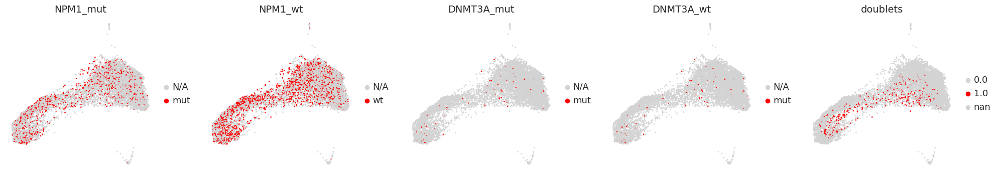

In [172]:
test10=patient_types("12H010",adata_full)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.41893768310546875 seconds
Jaccard graph constructed in 11.612497329711914 seconds
Wrote graph to binary file in 0.01872420310974121 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.900055
Louvain completed 21 runs in 10.789276599884033 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 34.41916036605835 seconds


... storing 'types' as categorical


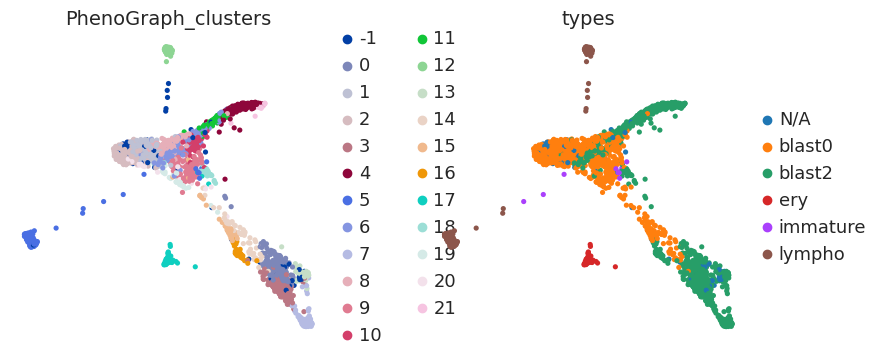

In [174]:
types07=patient_cluster_types(test07,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 2.2031044960021973 seconds
Jaccard graph constructed in 11.711665630340576 seconds
Wrote graph to binary file in 0.0372776985168457 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.918581
After 9 runs, maximum modularity is Q = 0.919678
Louvain completed 29 runs in 16.435107946395874 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 42.049784660339355 seconds


... storing 'types' as categorical


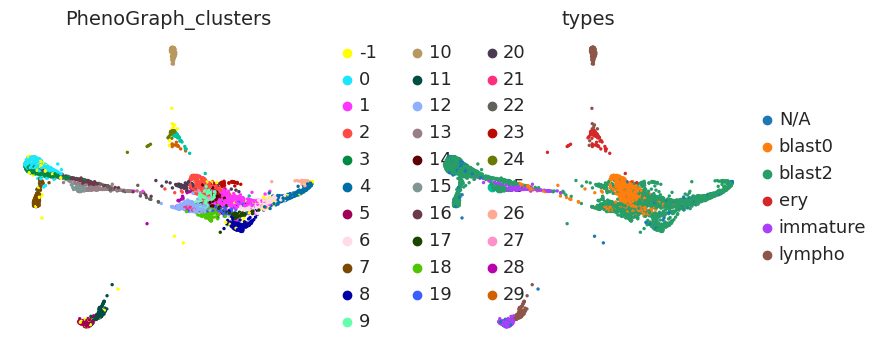

In [175]:
types07u=patient_cluster_types(test07u,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.7756168842315674 seconds
Jaccard graph constructed in 11.818257331848145 seconds
Wrote graph to binary file in 0.404843807220459 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.892315
After 2 runs, maximum modularity is Q = 0.89441
Louvain completed 22 runs in 13.365911960601807 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 38.90799140930176 seconds


... storing 'types' as categorical


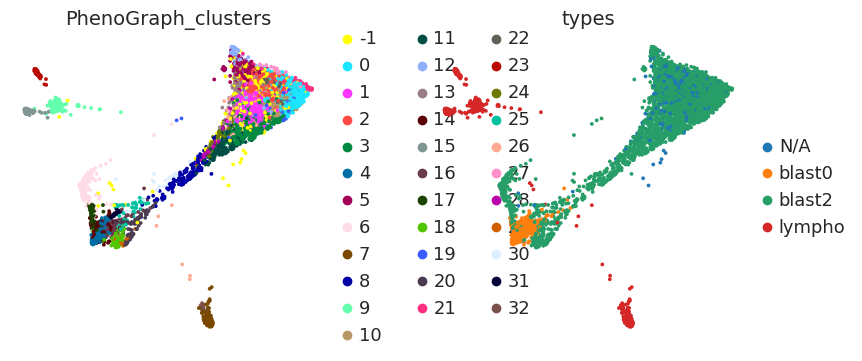

In [176]:
types09=patient_cluster_types(test09u,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 3.2755730152130127 seconds
Jaccard graph constructed in 11.702268600463867 seconds
Wrote graph to binary file in 0.08607959747314453 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.884682
Louvain completed 21 runs in 11.06727123260498 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 37.7401237487793 seconds


... storing 'types' as categorical


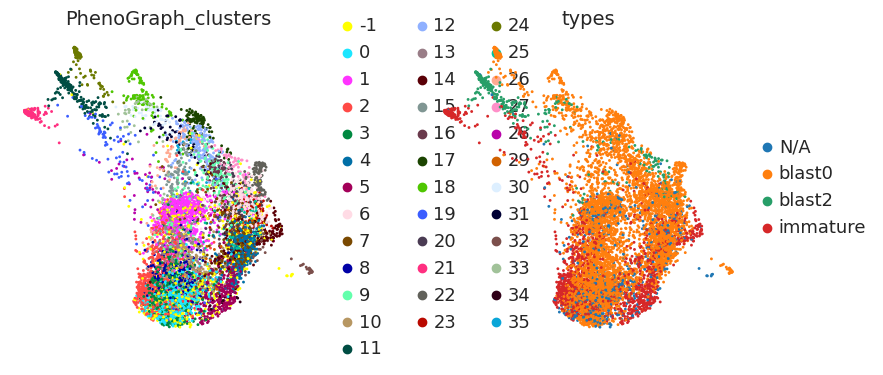

In [177]:
types58=patient_cluster_types(test58,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 4.562260389328003 seconds
Jaccard graph constructed in 11.734624862670898 seconds
Wrote graph to binary file in 0.10865283012390137 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.924467
Louvain completed 21 runs in 11.275330305099487 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 39.32121968269348 seconds


... storing 'types' as categorical


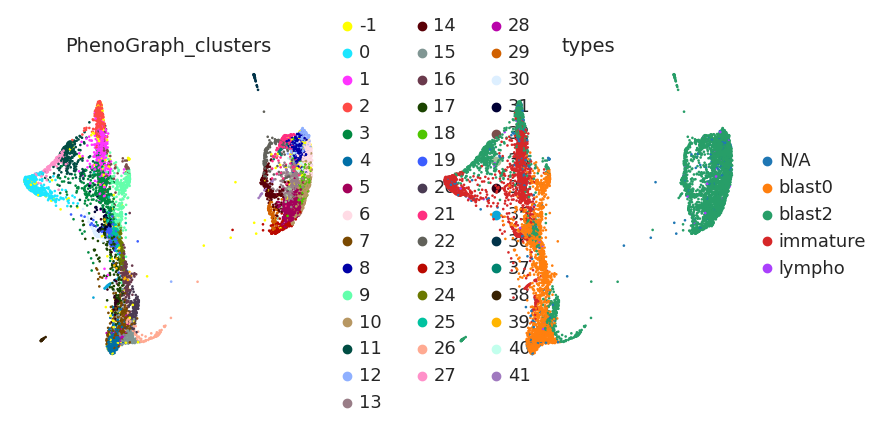

In [178]:
types58u=patient_cluster_types(test58u,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.9390699863433838 seconds
Jaccard graph constructed in 11.548148393630981 seconds
Wrote graph to binary file in 0.408707857131958 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.829097
After 2 runs, maximum modularity is Q = 0.830158
After 7 runs, maximum modularity is Q = 0.831403
Louvain completed 27 runs in 17.931862592697144 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 43.504029750823975 seconds


... storing 'types' as categorical


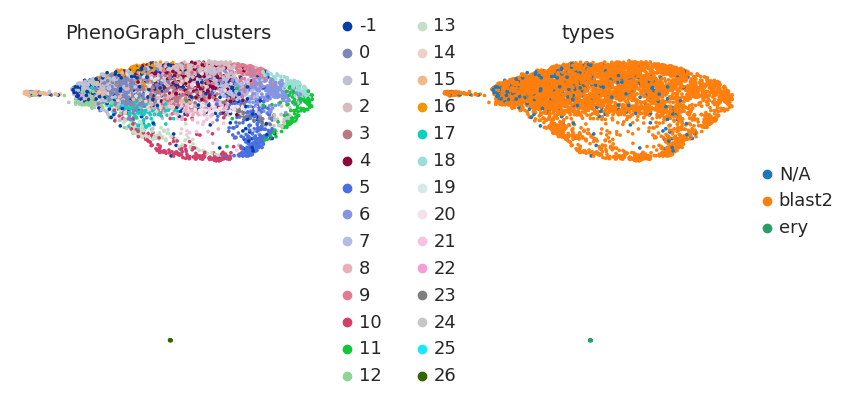

In [179]:
types56=patient_cluster_types(test56,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.7081775665283203 seconds
Jaccard graph constructed in 11.634093523025513 seconds
Wrote graph to binary file in 0.029761552810668945 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.891138
After 7 runs, maximum modularity is Q = 0.892367
Louvain completed 27 runs in 15.001719951629639 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 39.98113417625427 seconds


... storing 'types' as categorical


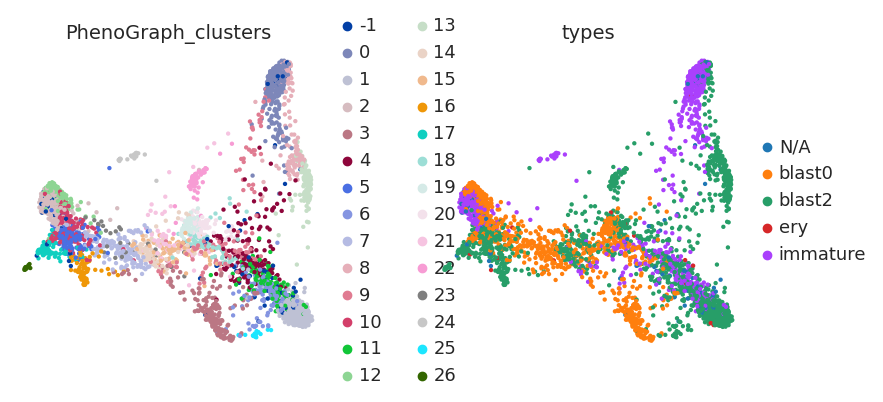

In [180]:
types56u=patient_cluster_types(test56u,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 3.3785135746002197 seconds
Jaccard graph constructed in 11.770992279052734 seconds
Wrote graph to binary file in 0.06896543502807617 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.908996
After 3 runs, maximum modularity is Q = 0.910533
Louvain completed 23 runs in 14.343342304229736 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 41.23236608505249 seconds


... storing 'types' as categorical


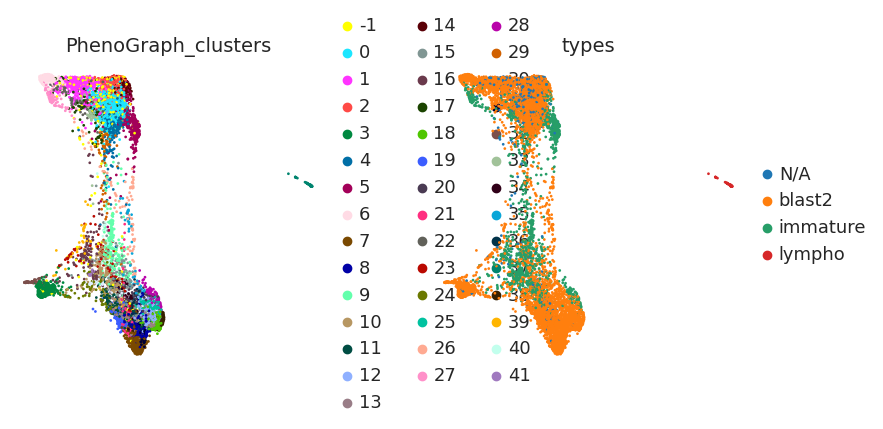

In [181]:
types40=patient_cluster_types(test40,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 3.6088757514953613 seconds
Jaccard graph constructed in 11.838318109512329 seconds
Wrote graph to binary file in 0.41598081588745117 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.862571
After 7 runs, maximum modularity is Q = 0.864368
Louvain completed 27 runs in 15.97723650932312 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 43.60804033279419 seconds


... storing 'types' as categorical


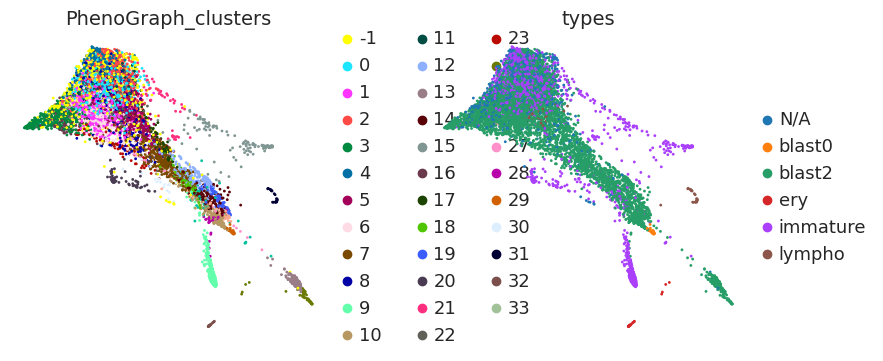

In [182]:
types40u=patient_cluster_types(test40u,celltypes)

Finding 5 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 3.4227254390716553 seconds
Jaccard graph constructed in 11.922458410263062 seconds
Wrote graph to binary file in 0.08439397811889648 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.852691
After 2 runs, maximum modularity is Q = 0.854722
Louvain completed 22 runs in 14.12787675857544 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 41.42202425003052 seconds


... storing 'types' as categorical


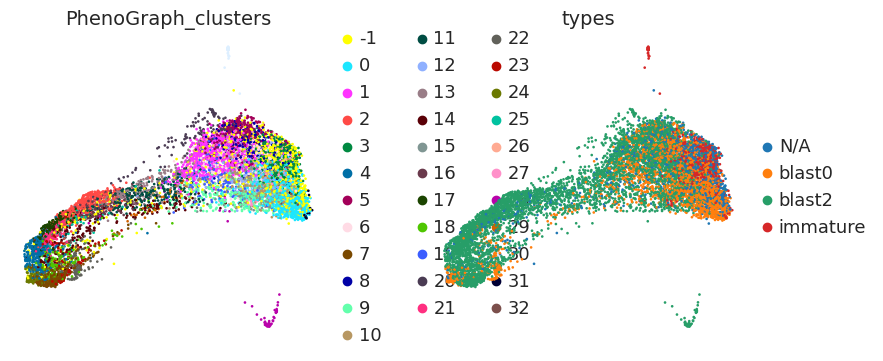

In [183]:
types10=patient_cluster_types(test10,celltypes)

Testing to see if patient-level clustering but using tet2 cohort-level DEGs will yield better results

In [173]:
def patient_cluster_types(test07,celltypes):    
    # pca of n_components
    sc.pp.pca(test07, n_comps= 100)

    communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(test07.obsm['X_pca']), k = k)

    test07.obs['PhenoGraph_clusters'] = pd.Categorical(communities)
    test07.uns['PhenoGraph_Q'] = Q

    #now filter the dnm patients down to the same set of degs found for tet2
    dnm_filtered=[]
    aml_genes=test07.var_names
    aml_genes_filtered=[]
    for i in range(len(aml_genes)):
        if aml_genes[i] in genes2k:
            dnm_filtered.append(test07.X[:,i])
            aml_genes_filtered.append(aml_genes[i])


    dnm_filtered=np.asarray(dnm_filtered)
    dnm_filtered.shape


    #build centroids using dnm data filtered to the same set of DEGs that were found for TET2
    maxx = np.amax(np.asarray(test07.obs['PhenoGraph_clusters']))+1
    cluster_ids=test07.obs['PhenoGraph_clusters']
    centroids=[]


    for i in range(maxx):
        temp=[]
        for j in range(len(cluster_ids)):
            if cluster_ids[j]==i:
                temp.append(dnm_filtered[:,j])
        #in case of empty clusters
        if np.asarray(temp).shape[0]==0:
            centroids.append([-1 for i in range(dnm_filtered.shape[0])])
        else:
            centroids.append(np.mean(temp,axis=0))

    centroids=np.asarray(centroids)

    #perform pearson correlation for each cluster centroid to obtain a cell type annotation for each cluster
    import scipy
    from scipy import stats
    celltypes = np.asarray(celltypes)
    types = [] #store celltype with lowest pval OR highest correlation coefficients
    typescoeff = [] #store the corr coeff for the selected celltype (for downstream filtering)
    corr = [] #store all pvals OR correlation coefficients for heatmap
    for i in range(centroids.shape[0]):
        pvals=[]
        corrcoeff=[]
        for j in range(dmap_filtered.shape[1]):
            pearson = scipy.stats.pearsonr(centroids[i],dmap_filtered[:,j])
            corrcoeff.append(pearson[0])
            pvals.append(pearson[1])
        corr.append(corrcoeff) #change this to append(pvals) if using pvals
        #print(i,celltypes[np.argmax(corrcoeff)],corrcoeff[np.argmax(corrcoeff)]) #change to argmin if using pvals
        types.append(celltypes[np.argmax(corrcoeff)]) #change to argmin if using pvals
        typescoeff.append(corrcoeff[np.argmax(corrcoeff)])

    #create a list of type labels for each cell based on which cluster it's in
    types_anno = []
    lympho_anno = test07.obs['lympho']
    ery_anno = test07.obs['ery']
    cluster_ids=test07.obs['PhenoGraph_clusters']

    for i in range(len(cluster_ids)):
        #if a cell has already been labeled as lympho or ery then just use that
        if lympho_anno[i]=="lympho":
            types_anno.append("lympho")
        elif ery_anno[i]=="ery":
            types_anno.append("ery")
        else:
            #we assign our -1 clusters to be N/A
            if cluster_ids[i]==-1:
                types_anno.append("N/A")
            else:
                types_anno.append(types[cluster_ids[i]])
        
    test07.obs['types']=types_anno
    
    #sc.pp.neighbors(test07, n_neighbors=10, n_pcs=None, 
    #                    use_rep=None, knn=True, random_state=0, 
    #                    method='umap', metric='euclidean', metric_kwds={}, copy=False)
    #sc.tl.draw_graph(test07,layout="fa")
    sc.pl.draw_graph(test07,layout="fa",color=["PhenoGraph_clusters","types"])
    return types_anno

Functions

In [51]:
#WRONG BAD DONT USE THIS

#def deg(adata, num, names=True, annot="PhenoGraph_clusters"):
#    #returns a list of DEGs found across all clusters
#    #num = number of degs to choose for each cluster
#    num_clusters = np.amax(np.asarray(adata.obs[annot]))+1
#    allgenes = adata.var_names
#    degind = []
#    for i in range(num_clusters):
#        cluster = get_cluster(adata, i, annot)
#        anticluster = get_anticluster(adata, i,annot)
#        #compute p value for each gene
#        pvals = scipy.stats.ttest_ind(cluster, anticluster,axis=0)[1]
#        #get the indices of genes with lowest p-value
#        degind.append(min_p(pvals, num))
#    #get rid of duplicate genes
#   unique_degind = np.unique(degind)
#   #convert indices to gene names
#   if names:
#       degs = []
#       for i in unique_degind:
#           degs.append(allgenes[i])
#       return degs
#   else:
#        return unique_degind


In [57]:
def deg(adata, num, names=True, annot="PhenoGraph_clusters", skip=None):
    #returns a list of DEGs found across all clusters
    #num = number of degs to choose for each cluster
    #names = whether or not to return gene names or gene indices
    #annot = which field of adata to use as cluster annotations
    #skip = label of cluster we want to skip, default None
    
    #num_clusters = np.unique(adata.obs[annot]).shape[0]
    allgenes = adata.var_names
    degind = []
    for i in np.unique(adata.obs[annot]):
        if i not in skip:
            
            cluster = get_cluster(adata, i, annot)
            anticluster = get_anticluster(adata, i,annot)

            wasserstein_distances=[]

            for j in range(allgenes.shape[0]):
                #for each gene, compute the mean expression in cluster vs out of cluster
                cluster_mean=np.mean(cluster[:,j])
                anticluster_mean=np.mean(anticluster[:,j])

                #use positive wasserstein
                if cluster_mean>anticluster_mean:
                    wasserstein_distances.append(scipy.stats.wasserstein_distance(np.divide(cluster[:,j],np.sum(cluster[:,j])),np.divide(anticluster[:,j],np.sum(anticluster[:,j]))))

                #use negative wasserstein
                else:
                    wasserstein_distances.append(-1*scipy.stats.wasserstein_distance(np.divide(cluster[:,j],np.sum(cluster[:,j])),np.divide(anticluster[:,j],np.sum(anticluster[:,j]))))
    
        
            #get the indices of genes with greatest wasserstein distance
            #get the indices of genes with greatest wasserstein distance
            inds=np.flip(np.argsort(wasserstein_distances))

            not_nan=0
            for i in range(len(inds)):
                if np.isnan(wasserstein_distances[inds[i]])==False:
                    not_nan=i
                    break
            degind.append(inds[not_nan:not_nan+num])
            
    #get rid of duplicate genes
    unique_degind = np.unique(degind)
    #convert indices to gene names
    if names:
        degs = []
        for i in unique_degind:
            degs.append(allgenes[i])
        return degs
    else:
        return unique_degind


In [52]:
def get_cluster(adata, n, annot):
    #returns all the cells belonging to cluster n 
    data = adata.to_df()
    data = data.to_numpy()
    ids = list(adata.obs[annot])
    clusters=[]
    for i in range(data.shape[0]):
        if ids[i]==n:
            clusters.append(data[i])
    return np.asarray(clusters)

In [53]:
def get_anticluster(adata, n, annot):
    #returns all the cells NOT belonging to cluster n 
    data = adata.to_df()
    data = data.to_numpy()
    ids = list(adata.obs[annot])
    clusters=[]
    for i in range(data.shape[0]):
        if ids[i]!=n:
            clusters.append(data[i])
    return np.asarray(clusters)

In [54]:
#NO GOOD DO NOT RELY ON P-VALUES

#def min_p(pvals,n):
#    degind=[] #indices of most differentially expressed genes (lowest p values), in order###

#    minindex=-1
#    #initialize minindex to an index that isn't nan
#    for i in range(len(pvals)):
#        if np.isnan(pvals[i])==False:
#            minindex=i
#            break
#    if minindex==-1:
#        return []
#    
#    #take top n DEGs
#    for j in range(n):
#        for i in range(len(pvals)):
#            if (pvals[i]<pvals[minindex]):
#                if (np.isnan(pvals[i])==False):
#                    minindex=i
#        degind.append(minindex)
#        pvals[minindex]=100
#    return degind

Entropy

In [182]:
adjacency=adata_full.obsp['connectivities'].toarray()

In [183]:
#compute the entropy for each cell by seeing whether neighboring cells came from the same patient or not
#numerical indicator is used as an easier way of indexing patient sample labels
entropy=[]

for i in range(adjacency.shape[0]):
    hist=np.zeros((6)) #size corresponds to number of patient samples (sorted and unsorted together)
    for j in range(adjacency.shape[1]):
        #store values for histogram (counts for how many cells belog to each cluster)
        #if two cells are neighbors
        if adjacency[i][j]==1:
            hist[numericalindicator[j]]+=1
    #compute entropy
    entropy.append(scipy.stats.entropy(hist, axis=0))

/home/lf2684/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:2751: RuntimeWarning: invalid value encountered in true_divide
  pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


In [184]:
adata_full.obs['entropy']=entropy

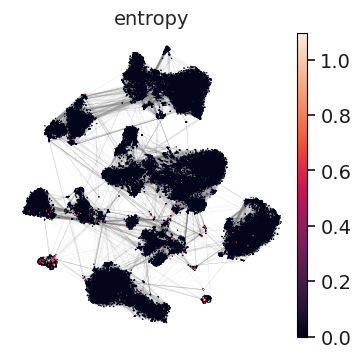

In [185]:
sc.set_figure_params(dpi=100, frameon = None)
sc.pl.tsne(
    adata_full, 
    color=['entropy'],
    edges = True, edges_width = 0.025,
    s=4
)

In [186]:
 adata_full.write_h5ad("dnm_cohort_FULL_07_05_21.h5")

In [4]:
ad = sc.read_h5ad("dnm_cohort_FULL_07_05_21.h5")

In [7]:
obs = ad.obs

In [8]:
sc.pp.neighbors(ad,n_neighbors=30)

adj = ad.obsp["connectivities"].todense()

adj = np.asarray(adj)
#fix so that self-self connectivity is 1 (to prevent cells from zeroeing out if no neighbors)
for i in range(adj.shape[0]):
    adj[i][i]==1

mut_ratio = []

for i in range(adj.shape[0]):
    muts = list(obs["NPM1_mut"][np.nonzero(adj[i])[0]]).count("mut")
    wt = list(obs["NPM1_wt"][np.nonzero(adj[i])[0]]).count("wt")
    mut_ratio.append(muts/(wt+1))

In [9]:
ad.obs["mut ratio"] = mut_ratio

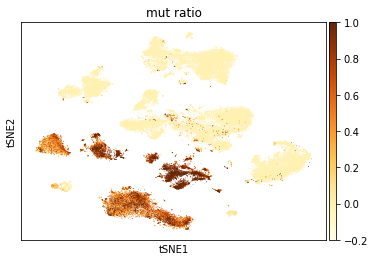

In [19]:
sc.pl.tsne(ad,color="mut ratio",vmax=1,vmin=-.2,cmap='YlOrBr',save="whole_cohort_mut.pdf")